# 1. 라이브러리 로드

In [1]:
!pip install koreanize-matplotlib transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 53.8 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import koreanize_matplotlib
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from torch.utils.data import DataLoader, TensorDataset
from torch.utils.tensorboard import SummaryWriter

from transformers import InformerConfig, InformerModel, InformerForPrediction

import warnings
warnings.filterwarnings('ignore')

# 2. 데이터 로드

In [3]:
col_to_use = [
    'region', 'date', 'volume_cnt',
    'avg_area_size', 'avg_sales', 'avg_floor_cnt',

    'pod_index', 'abs_vdd_index', 'canceld_index', 'direct_trade_ratio', 'anomaly_abs_vdd_score',

    'wolse_volume_cnt', 'jeonse_volume_cnt', 'wolse_avg_area_size',
    'jeonse_avg_area_size', 'wolse_avg_deposit', 'jeonse_avg_deposit',
    'wolse_avg_monthly', 'wolse_avg_floor_cnt', 'jeonse_avg_floor_cnt',

    'townhouse_volume_cnt', 'townhouse_avg_area_size',
    'townhouse_avg_sales', 'townhouse_avg_floor_cnt',
    'townhouse_jeonse_volume_cnt', 'townhouse_wolse_avg_area_size',
    'townhouse_jeonse_avg_area_size', 'townhouse_wolse_avg_floor_cnt',
    'townhouse_jeonse_avg_floor_cnt', 'townhouse_wolse_avg_deposit',
    'townhouse_jeonse_avg_deposit', 'townhouse_wolse_avg_monthly',

    'familyhouse_volume_cnt', 'familyhouse_avg_area_size',
    'familyhouse_avg_sales', 'familyhouse_wolse_volume_cnt',
    'familyhouse_jeonse_volume_cnt', 'familyhouse_wolse_avg_area_size',
    'familyhouse_jeonse_avg_area_size', 'familyhouse_wolse_avg_deposit',
    'familyhouse_jeonse_avg_deposit', 'familyhouse_wolse_avg_monthly',

    'officehouse_volume_cnt', 'officehouse_avg_area_size',
    'officehouse_avg_sales', 'officehouse_avg_floor_cnt',
    'officehouse_wolse_volume_cnt', 'officehouse_jeonse_volume_cnt',
    'officehouse_wolse_avg_area_size', 'officehouse_jeonse_avg_area_size',
    'officehouse_wolse_avg_floor_cnt', 'officehouse_jeonse_avg_floor_cnt',
    'officehouse_wolse_avg_deposit', 'officehouse_jeonse_avg_deposit',
    'officehouse_wolse_avg_monthly', 'townhouse_wolse_volume_cnt',

    'is_anomaly_score_outlier_mean_1sigma_win5',
       'is_anomaly_score_outlier_mean_2sigma_win5',
       'is_anomaly_score_outlier_mean_3sigma_win5',
       'is_anomaly_score_outlier_mean_1sigma_win10',
       'is_anomaly_score_outlier_mean_2sigma_win10',
       'is_anomaly_score_outlier_mean_3sigma_win10',
       'is_anomaly_score_outlier_mean_1sigma_win15',
       'is_anomaly_score_outlier_mean_2sigma_win15',
       'is_anomaly_score_outlier_mean_3sigma_win15',
       'is_anomaly_score_outlier_mean_1sigma_win20',
       'is_anomaly_score_outlier_mean_2sigma_win20',
       'is_anomaly_score_outlier_mean_3sigma_win20',
       'is_anomaly_score_outlier_mean_1sigma_win25',
       'is_anomaly_score_outlier_mean_2sigma_win25',
       'is_anomaly_score_outlier_mean_3sigma_win25',
       'is_anomaly_score_outlier_mean_1sigma_win30',
       'is_anomaly_score_outlier_mean_2sigma_win30',
       'is_anomaly_score_outlier_mean_3sigma_win30'
]

In [4]:
apt_volume_train_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_train_anomaly_score_label_combi3.csv')[col_to_use]
apt_volume_valid_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_valid_anomaly_score_label_combi3.csv')[col_to_use]
apt_volume_test_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi3.csv')[col_to_use]

In [5]:
len(apt_volume_train_df), len(apt_volume_valid_df), len(apt_volume_test_df)

(20550, 3025, 5350)

# 3. 데이터 전처리
* Set	기간	개월 수

In [12]:
def scale_features_from_split(train_df, valid_df, test_df, features, target_col=None, target_clean_col=None):
    """
    train_df 기준으로 MinMaxScaler fit 후 전체 transform.
    - train/valid: 보정된 종속변수 target_clean_col 기준으로 transform
    - test: 원본 종속변수 target_col 기준으로 transform
    - 반환되는 결과는 모두 DataFrame
    """

    # 👉 fit 시 사용할 feature + 보정된 target 컬럼
    train_df_copy = train_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})
    valid_df_copy = valid_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})
    test_df_copy  = test_df.copy()[features + [target_col]].rename(columns={target_col: 'target'})

    # 👉 fit
    scaler = MinMaxScaler()
    scaler.fit(train_df_copy)

    # 👉 transform (np.ndarray 반환됨)
    train_scaled_vals = scaler.transform(train_df_copy)
    valid_scaled_vals = scaler.transform(valid_df_copy)
    test_scaled_vals  = scaler.transform(test_df_copy)

    # 👉 컬럼명 구성: features + 'target'
    scaled_columns = features + ['target']

    # 👉 DataFrame으로 복구
    train_scaled_df = pd.DataFrame(train_scaled_vals, columns=scaled_columns, index=train_df.index)
    valid_scaled_df = pd.DataFrame(valid_scaled_vals, columns=scaled_columns, index=valid_df.index)
    test_scaled_df  = pd.DataFrame(test_scaled_vals,  columns=scaled_columns, index=test_df.index)

    # 🟡 'date' 컬럼 유지
    for df_orig, df_scaled in zip([train_df, valid_df, test_df], [train_scaled_df, valid_scaled_df, test_scaled_df]):
        if ("date" in df_orig.columns) and ('region' in df_orig.columns):
            df_scaled["date"] = df_orig["date"]
            df_scaled["region"] = df_orig["region"]

    return train_scaled_df, valid_scaled_df, test_scaled_df, scaler


In [13]:
def generate_time_features(dates: pd.Series) -> np.ndarray:
    """
    날짜 Series를 받아 시간 특성 (month, day, weekday, dayofyear) 생성
    """
    dates = pd.to_datetime(dates)

    features = np.stack([
        dates.dt.month / 12.0,
        dates.dt.day / 31.0,
        dates.dt.weekday / 6.0,
        dates.dt.dayofyear / 366.0
    ], axis=1)

    return features  # shape: [len(dates), 4]

In [14]:
# 📌 시계열 window 데이터셋 생성 함수
def create_informer_dataset(df, feature_cols, target_col, region_col, date_col,
                            input_len=30, label_len=15, pred_len=15):
    """
    Informer 입력에 맞게 window 기반 데이터셋 생성
    반환: x_enc, x_dec, y, region_id, x_mark_enc, x_mark_dec
    """
    x_enc_all, x_dec_all, y_all, region_ids = [], [], [], []
    x_mark_enc_all, x_mark_dec_all = [], []

    total_window = input_len + pred_len
    for i in range(len(df) - total_window + 1):
        enc_window = df.iloc[i:i+input_len]
        dec_input = df.iloc[i+input_len-label_len:i+input_len+pred_len]
        y = df[target_col].iloc[i+input_len:i+input_len+pred_len].values

        # Feature 입력
        x_enc = enc_window[feature_cols].values
        x_dec = dec_input[feature_cols].copy().values
        x_dec[label_len:] = 0  # 미래 구간은 zero

        # 시간 마킹 입력
        x_mark_enc = generate_time_features(enc_window[date_col])
        x_mark_dec = generate_time_features(dec_input[date_col])

        # 저장
        x_enc_all.append(x_enc)
        x_dec_all.append(x_dec)
        y_all.append(y)
        region_ids.append(df[region_col].iloc[i])
        x_mark_enc_all.append(x_mark_enc)
        x_mark_dec_all.append(x_mark_dec)

    return (
        np.array(x_enc_all),         # [N, input_len, C]
        np.array(x_dec_all),         # [N, label_len+pred_len, C]
        np.array(y_all),             # [N, pred_len]
        np.array(region_ids),        # [N]
        np.array(x_mark_enc_all),    # [N, input_len, T]
        np.array(x_mark_dec_all)     # [N, label_len+pred_len, T]
    )

In [ ]:
# # 📌 시계열 split 함수 (6:2:2 기준)
# def timeseries_split(df, train_periods, valid_periods, test_periods):
#     """
#     시계열 데이터를 6:2:2로 split
#     """
#     train_df = df.query(f"date >= '{train_periods[0]}' and date <= '{train_periods[1]}'")
#     valid_df = df.query(f"date >= '{valid_periods[0]}' and date <= '{valid_periods[1]}'")
#     test_df = df.query(f"date >= '{test_periods[0]}' and date <= '{test_periods[1]}'")

#     return train_df, valid_df, test_df

In [15]:
def build_informer_datasets_from_split(
    train_df,
    valid_df,
    test_df,
    feature_cols,
    region_col,
    input_len=30,
    label_len=15,
    pred_len=5
):

    region2idx = {r: i for i, r in enumerate(pd.concat([train_df, valid_df, test_df])[region_col].unique())}
    region_scalers = {}

    data = {
        "train": {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []},
        "val":   {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []},
        "test":  {"x_enc": [], "x_dec": [], "y": [], "region": [], "x_mark_enc": [], "x_mark_dec": []}
    }

    df_train_all, df_val_all, df_test_all = [], [], []

    for region in region2idx.keys():
        region_id = region2idx[region]

        # 지역별 분리
        train_r = train_df[train_df[region_col] == region].sort_values("date").reset_index(drop=True)
        valid_r = valid_df[valid_df[region_col] == region].sort_values("date").reset_index(drop=True)
        test_r = test_df[test_df[region_col] == region].sort_values("date").reset_index(drop=True)

        # 스케일링: train/valid은 volume_cnt_clean 기준, test는 원본 volume_cnt 기준
        scaled_train, scaled_valid, scaled_test, scaler = scale_features_from_split(
            train_df=train_r,
            valid_df=valid_r,
            test_df=test_r,
            features=feature_cols,
            target_col="volume_cnt",
            target_clean_col="volume_cnt_scaled"
        )
        region_scalers[region] = scaler

        # 👉 target 컬럼명을 'volume_cnt_scaled'로 변경
        scaled_train = scaled_train.rename(columns={"target": "volume_cnt"})
        scaled_valid = scaled_valid.rename(columns={"target": "volume_cnt"})
        scaled_test  = scaled_test.rename(columns={"target": "volume_cnt"})  # test는 원래 컬럼명 유지

        df_train_all.append(scaled_train)
        df_val_all.append(scaled_valid)
        df_test_all.append(scaled_test)

        for split_name, df_split, target_col in [
            ("train", scaled_train, "volume_cnt"),
            ("val", scaled_valid, "volume_cnt"),
            ("test", scaled_test, "volume_cnt")
        ]:
            x_enc, x_dec, y, _, x_mark_enc, x_mark_dec = create_informer_dataset(
                df_split,
                feature_cols=feature_cols,
                target_col=target_col,
                region_col=region_col,
                date_col="date",
                input_len=input_len,
                label_len=label_len,
                pred_len=pred_len
            )

            data[split_name]["x_enc"].append(x_enc)
            data[split_name]["x_dec"].append(x_dec)
            data[split_name]["y"].append(y)
            data[split_name]["x_mark_enc"].append(x_mark_enc)
            data[split_name]["x_mark_dec"].append(x_mark_dec)
            data[split_name]["region"].extend([region_id] * len(x_enc))

    # 병합
    for split in ["train", "val", "test"]:
        for key in ["x_enc", "x_dec", "y", "x_mark_enc", "x_mark_dec"]:
            data[split][key] = np.concatenate(data[split][key], axis=0)
        data[split]["region"] = np.array(data[split]["region"])

    origin_df_dic = {
        "train": pd.concat(df_train_all, ignore_index=True),
        "val": pd.concat(df_val_all, ignore_index=True),
        "test": pd.concat(df_test_all, ignore_index=True)
    }

    return data, region_scalers, region2idx, origin_df_dic


In [16]:
feature_cols = [
                  'avg_area_size', 'avg_sales', 'avg_floor_cnt',

                  # 'pod_index', 'abs_vdd_index', 'canceld_index', 'direct_trade_ratio', 'anomaly_abs_vdd_score',

                  'wolse_volume_cnt', 'jeonse_volume_cnt', 'wolse_avg_area_size',
                  'jeonse_avg_area_size', 'wolse_avg_deposit', 'jeonse_avg_deposit',
                  'wolse_avg_monthly', 'wolse_avg_floor_cnt', 'jeonse_avg_floor_cnt',

                  'townhouse_volume_cnt', 'townhouse_avg_area_size',
                  'townhouse_avg_sales', 'townhouse_avg_floor_cnt',
                  'townhouse_jeonse_volume_cnt', 'townhouse_wolse_avg_area_size',
                  'townhouse_jeonse_avg_area_size', 'townhouse_wolse_avg_floor_cnt',
                  'townhouse_jeonse_avg_floor_cnt', 'townhouse_wolse_avg_deposit',
                  'townhouse_jeonse_avg_deposit', 'townhouse_wolse_avg_monthly',

                  'familyhouse_volume_cnt', 'familyhouse_avg_area_size',
                  'familyhouse_avg_sales', 'familyhouse_wolse_volume_cnt',
                  'familyhouse_jeonse_volume_cnt', 'familyhouse_wolse_avg_area_size',
                  'familyhouse_jeonse_avg_area_size', 'familyhouse_wolse_avg_deposit',
                  'familyhouse_jeonse_avg_deposit', 'familyhouse_wolse_avg_monthly',

                  'officehouse_volume_cnt', 'officehouse_avg_area_size',
                  'officehouse_avg_sales', 'officehouse_avg_floor_cnt',
                  'officehouse_wolse_volume_cnt', 'officehouse_jeonse_volume_cnt',
                  'officehouse_wolse_avg_area_size', 'officehouse_jeonse_avg_area_size',
                  'officehouse_wolse_avg_floor_cnt', 'officehouse_jeonse_avg_floor_cnt',
                  'officehouse_wolse_avg_deposit', 'officehouse_jeonse_avg_deposit',
                  'officehouse_wolse_avg_monthly', 'townhouse_wolse_volume_cnt'
              ]

# is_anomaly_score_outlier, is_anomaly_score_outlier_25.0%, is_anomaly_score_outlier_15.0%, is_anomaly_score_outlier_5.0%

# train, valid set은 정상 라벨 데이터만 반영
anomaly_score_label_col = 'is_anomaly_score_outlier_mean_2sigma_win30'
data_dict, scaler, region2idx, origin_df_dic = build_informer_datasets_from_split(
                                                      train_df=apt_volume_train_df[apt_volume_train_df[f'{anomaly_score_label_col}'] == 0],
                                                      valid_df=apt_volume_valid_df[apt_volume_train_df[f'{anomaly_score_label_col}'] == 0],
                                                      test_df=apt_volume_test_df,
                                                      feature_cols=feature_cols,
                                                      region_col='region',
                                                      input_len=30,
                                                      label_len=10,
                                                      pred_len=1
                                                  )

In [17]:
len(apt_volume_train_df), len(apt_volume_valid_df), len(apt_volume_test_df)

(20550, 3025, 5350)

In [18]:
len(origin_df_dic['train']), len(origin_df_dic['val']), len(origin_df_dic['test'])

(19371, 2848, 5350)

In [19]:
# 📌 TRAIN SET
X_train_enc = data_dict['train']['x_enc']
X_train_dec = data_dict['train']['x_dec']
y_train     = data_dict['train']['y']
region_train = data_dict['train']['region']
X_mark_enc_train = data_dict['train']['x_mark_enc']
X_mark_dec_train = data_dict['train']['x_mark_dec']

# 📌 VALIDATION SET
X_val_enc = data_dict['val']['x_enc']
X_val_dec = data_dict['val']['x_dec']
y_val     = data_dict['val']['y']
region_val = data_dict['val']['region']
X_mark_enc_val = data_dict['val']['x_mark_enc']
X_mark_dec_val = data_dict['val']['x_mark_dec']

# 📌 TEST SET
X_test_enc = data_dict['test']['x_enc']
X_test_dec = data_dict['test']['x_dec']
y_test     = data_dict['test']['y']
region_test = data_dict['test']['region']
X_mark_enc_test = data_dict['test']['x_mark_enc']
X_mark_dec_test = data_dict['test']['x_mark_dec']

# 4. Torch Dataset 구성

In [20]:
import torch
from torch.utils.data import Dataset

class InformerRegionDataset(Dataset):
    def __init__(self, x_enc, x_dec, y, region_ids, x_mark_enc, x_mark_dec):
        """
        x_enc:        [N, input_len, num_features]
        x_dec:        [N, label_len + pred_len, num_features]
        y:            [N, pred_len]
        region_ids:   [N]
        x_mark_enc:   [N, input_len, time_feature_dim]
        x_mark_dec:   [N, label_len + pred_len, time_feature_dim]
        """
        self.x_enc = x_enc
        self.x_dec = x_dec
        self.y = y
        self.region_ids = region_ids
        self.x_mark_enc = x_mark_enc
        self.x_mark_dec = x_mark_dec

    def __len__(self):
        return len(self.x_enc)

    def __getitem__(self, idx):
        x_enc = torch.tensor(self.x_enc[idx], dtype=torch.float32)
        x_dec = torch.tensor(self.x_dec[idx], dtype=torch.float32)
        y = torch.tensor(self.y[idx], dtype=torch.float32)
        region_id = torch.tensor(self.region_ids[idx], dtype=torch.long)
        x_mark_enc = torch.tensor(self.x_mark_enc[idx], dtype=torch.float32)
        x_mark_dec = torch.tensor(self.x_mark_dec[idx], dtype=torch.float32)

        return x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id


In [21]:
batch_size = 64

# ✅ Train
train_dataset = InformerRegionDataset(
    X_train_enc, X_train_dec, y_train, region_train,
    X_mark_enc_train, X_mark_dec_train
)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

# ✅ Validation
val_dataset = InformerRegionDataset(
    X_val_enc, X_val_dec, y_val, region_val,
    X_mark_enc_val, X_mark_dec_val
)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# ✅ Test
test_dataset = InformerRegionDataset(
    X_test_enc, X_test_dec, y_test, region_test,
    X_mark_enc_test, X_mark_dec_test
)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [22]:
for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in train_loader:

    print("x_enc:", x_enc.shape)       # [64, 30, feature_dim]
    print("x_mark_enc:", x_mark_enc.shape)  # [64]

    print("x_dec:", x_dec.shape)       # [64, 30, feature_dim]
    print("x_mark_dec:", x_mark_dec.shape)  # [64]

    print("y:", y.shape)               # [64,] or [64, pred_len]
    print("region_id:", region_id.shape)  # [64]
    break

x_enc: torch.Size([64, 30, 48])
x_mark_enc: torch.Size([64, 30, 4])
x_dec: torch.Size([64, 11, 48])
x_mark_dec: torch.Size([64, 11, 4])
y: torch.Size([64, 1])
region_id: torch.Size([64])


# 5. Informer Model

In [ ]:
class TriangularCausalMask():
    def __init__(self, B, L, device="cpu"):
        mask_shape = [B, 1, L, L]
        with torch.no_grad():
            self._mask = torch.triu(torch.ones(mask_shape, dtype=torch.bool), diagonal=1).to(device)

    @property
    def mask(self):
        return self._mask

class ProbMask():
    def __init__(self, B, H, L, index, scores, device="cpu"):
        _mask = torch.ones(L, scores.shape[-1], dtype=torch.bool).to(device).triu(1)
        _mask_ex = _mask[None, None, :].expand(B, H, L, scores.shape[-1])
        indicator = _mask_ex[torch.arange(B)[:, None, None],
                             torch.arange(H)[None, :, None],
                             index, :].to(device)
        self._mask = indicator.view(scores.shape).to(device)

    @property
    def mask(self):
        return self._mask

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/sogang_thesis_prj')

import os
os.chdir('/content/drive/MyDrive/sogang_thesis_prj')

from Informer.encoder import Encoder, EncoderLayer, ConvLayer, EncoderStack
from Informer.decoder import Decoder, DecoderLayer
from Informer.attn import FullAttention, ProbAttention, AttentionLayer
from Informer.embed import DataEmbedding

class APTRegionInformer(nn.Module):
    def __init__(self, enc_in, dec_in, c_out, seq_len, label_len, out_len,
                 region_vocab_size=25, region_emb_dim=4,
                 factor=5, d_model=512, n_heads=8, e_layers=3, d_layers=2, d_ff=512,
                 dropout=0.0, attn='prob', embed='fixed', freq='d', activation='gelu',
                 output_attention=False, distil=True, mix=True,
                 device=torch.device('cuda:0')):

        super(APTRegionInformer, self).__init__()
        self.pred_len = out_len
        self.attn = attn
        self.output_attention = output_attention
        self.region_emb_dim = region_emb_dim

        # 🟡 지역 임베딩 레이어 추가
        self.region_embedding = nn.Embedding(region_vocab_size, region_emb_dim)

        # 🔵 임베딩 레이어 입력 차원 수정 (enc_in + region_emb_dim)
        self.enc_embedding = DataEmbedding(enc_in + region_emb_dim, d_model, embed, freq, dropout)
        self.dec_embedding = DataEmbedding(dec_in + region_emb_dim, d_model, embed, freq, dropout)

        # Attention
        Attn = ProbAttention if attn == 'prob' else FullAttention

        # Encoder
        self.encoder = Encoder(
            [
                EncoderLayer(
                    AttentionLayer(Attn(False, factor, attention_dropout=dropout, output_attention=output_attention),
                                   d_model, n_heads, mix=False),
                    d_model, d_ff, dropout=dropout, activation=activation
                ) for _ in range(e_layers)
            ],
            [
                ConvLayer(d_model) for _ in range(e_layers - 1)
            ] if distil else None,
            norm_layer=nn.LayerNorm(d_model)
        )

        # Decoder
        self.decoder = Decoder(
            [
                DecoderLayer(
                    AttentionLayer(Attn(True, factor, attention_dropout=dropout, output_attention=False),
                                   d_model, n_heads, mix=mix),
                    AttentionLayer(FullAttention(False, factor, attention_dropout=dropout, output_attention=False),
                                   d_model, n_heads, mix=False),
                    d_model, d_ff, dropout=dropout, activation=activation
                )
                for _ in range(d_layers)
            ],
            norm_layer=nn.LayerNorm(d_model)
        )

        self.projection = nn.Linear(d_model, c_out, bias=True)
        self.softplus = nn.Softplus()

    def forward(self, x_enc, x_mark_enc, x_dec, x_mark_dec, region_id,
                enc_self_mask=None, dec_self_mask=None, dec_enc_mask=None):

        # 🟡 지역 임베딩 벡터 획득
        region_emb = self.region_embedding(region_id)  # [B, region_emb_dim]
        region_emb = region_emb.unsqueeze(1).expand(-1, x_enc.shape[1], -1)  # [B, seq_len, region_emb_dim]

        # 🟡 지역 임베딩 벡터를 입력에 concat
        x_enc = torch.cat([x_enc, region_emb], dim=-1)
        x_dec = torch.cat([x_dec, region_emb[:, :x_dec.shape[1], :]], dim=-1)

        # 인코더 & 디코더 임베딩
        enc_out = self.enc_embedding(x_enc, x_mark_enc)
        enc_out, attns = self.encoder(enc_out, attn_mask=enc_self_mask)

        dec_out = self.dec_embedding(x_dec, x_mark_dec)
        dec_out = self.decoder(dec_out, enc_out, x_mask=dec_self_mask, cross_mask=dec_enc_mask)

        # 최종 projection
        output = self.softplus(self.projection(dec_out))

        if self.output_attention:
            return output[:, -self.pred_len:, :], attns
        else:
            return output[:, -self.pred_len:, :]


# 5. 모델 훈련

In [ ]:
class RMSELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(RMSELoss, self).__init__()
        self.mse = nn.MSELoss()
        self.eps = eps  # 0으로 나누는 것 방지

    def forward(self, y_pred, y_true):
        return torch.sqrt(self.mse(y_pred, y_true) + self.eps)

class MAELoss(nn.Module):
    def __init__(self):
        super(MAELoss, self).__init__()

    def forward(self, y_pred, y_true):
        return torch.mean(torch.abs(y_true - y_pred))

# MAPE Loss (Mean Absolute Percentage Error)
class MAPELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(MAPELoss, self).__init__()
        self.eps = eps

    def forward(self, y_pred, y_true):
        return torch.mean(torch.abs((y_true - y_pred) / (y_true + self.eps))) * 100

# SMAPE = 2 * abs(y_pred - y_true) / (abs(y_true) + abs(y_pred))
class SMAPELoss(nn.Module):
    def __init__(self, eps=1e-8):
        super(SMAPELoss, self).__init__()
        self.eps = eps

    def forward(self, y_pred, y_true):
        numerator = torch.abs(y_true - y_pred)
        denominator = torch.abs(y_true) + torch.abs(y_pred) + self.eps
        return torch.mean(2 * numerator / denominator) * 100

In [ ]:
model = APTRegionInformer(
    enc_in=48,            # x_enc의 마지막 차원
    dec_in=48,            # x_dec의 마지막 차원
    c_out=1,             # y의 feature 수 (현재 y가 [64, 5]라면 c_out=1, 다변량이면 다르게)
    seq_len=30,          # x_enc의 시계열 길이
    label_len=10,        # x_dec의 과거 부분 길이 (20 = 15 past + 5 future 라면 이게 맞음)
    out_len=1,           # y 또는 미래 예측 길이 (5일 예측)
    region_vocab_size=25,
    region_emb_dim=64,
    d_model=64,
    d_ff=256,
    dropout=0.1,

    e_layers=2,
    d_layers=2,
    n_heads=4
)

criterion = nn.MSELoss()
lr_rate = 1e-4
optimizer = torch.optim.AdamW(model.parameters(), lr=lr_rate)

In [ ]:
def train_one_epoch(model, dataloader, criterion, optimizer, device, mae_loss_fn, rmse_loss_fn):
    model.train()
    total_loss = 0
    total_rmse = 0
    total_mae = 0

    for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in dataloader:
        x_enc       = x_enc.to(device)
        x_mark_enc  = x_mark_enc.to(device)
        x_dec       = x_dec.to(device)
        x_mark_dec  = x_mark_dec.to(device)
        y           = y.to(device)
        region_id   = region_id.to(device)

        optimizer.zero_grad()
        output = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_id)  # [B, pred_len, 1]
        output = output.squeeze(-1)  # [B, pred_len]

        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_rmse += rmse_loss_fn(output, y).item()
        total_mae += mae_loss_fn(output, y).item()

    n = len(dataloader)
    return {
        'loss': total_loss / n,
        'rmse': total_rmse / n,
        'mae': total_mae / n
    }


In [ ]:
@torch.no_grad()
def evaluate(model, dataloader, criterion, device, mae_loss_fn, rmse_loss_fn):
    model.eval()
    total_loss = 0
    total_rmse = 0
    total_mae = 0

    for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_id in dataloader:

        x_enc       = x_enc.to(device)
        x_mark_enc  = x_mark_enc.to(device)
        x_dec       = x_dec.to(device)
        x_mark_dec  = x_mark_dec.to(device)
        y           = y.to(device)
        region_id   = region_id.to(device)

        output = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_id)
        output = output.squeeze(-1)

        loss = criterion(output, y)

        total_loss += loss.item()
        total_rmse += rmse_loss_fn(output, y).item()
        total_mae += mae_loss_fn(output, y).item()

    n = len(dataloader)
    return {
        'loss': total_loss / n,
        'rmse': total_rmse / n,
        'mae': total_mae / n
    }


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

rmse_fn = RMSELoss()
mae_fn = MAELoss()

num_epochs = 50
writer = SummaryWriter(log_dir=f'runs/Informer_{num_epochs}')

for epoch in range(num_epochs):
    train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device, mae_fn, rmse_fn)
    val_metrics = evaluate(model, val_loader, criterion, device, mae_fn, rmse_fn)

    # 📌 텐서보드 기록
    writer.add_scalar('Train/Loss', train_metrics['loss'], epoch)
    writer.add_scalar('Train/RMSE', train_metrics['rmse'], epoch)
    writer.add_scalar('Train/MAE', train_metrics['mae'], epoch)

    writer.add_scalar('Val/Loss', val_metrics['loss'], epoch)
    writer.add_scalar('Val/RMSE', val_metrics['rmse'], epoch)
    writer.add_scalar('Val/MAE', val_metrics['mae'], epoch)

    # 📌 콘솔 출력
    print(f"[Epoch {epoch+1}]")
    print(f"Train Loss: {train_metrics['loss']:.4f}, RMSE: {train_metrics['rmse']:.4f}, MAE: {train_metrics['mae']:.4f}")
    print(f"Val   Loss: {val_metrics['loss']:.4f}, RMSE: {val_metrics['rmse']:.4f}, MAE: {val_metrics['mae']:.4f}")

writer.close()

[Epoch 1]
Train Loss: 0.0398, RMSE: 0.1853, MAE: 0.1526
Val   Loss: 0.1875, RMSE: 0.4258, MAE: 0.3244
[Epoch 2]
Train Loss: 0.0353, RMSE: 0.1769, MAE: 0.1455
Val   Loss: 0.1789, RMSE: 0.4162, MAE: 0.3150
[Epoch 3]
Train Loss: 0.0348, RMSE: 0.1761, MAE: 0.1449
Val   Loss: 0.1747, RMSE: 0.4113, MAE: 0.3106
[Epoch 4]
Train Loss: 0.0346, RMSE: 0.1755, MAE: 0.1444
Val   Loss: 0.1753, RMSE: 0.4121, MAE: 0.3116
[Epoch 5]
Train Loss: 0.0343, RMSE: 0.1751, MAE: 0.1438
Val   Loss: 0.1717, RMSE: 0.4076, MAE: 0.3073
[Epoch 6]
Train Loss: 0.0342, RMSE: 0.1747, MAE: 0.1437
Val   Loss: 0.1694, RMSE: 0.4048, MAE: 0.3048
[Epoch 7]
Train Loss: 0.0341, RMSE: 0.1745, MAE: 0.1434
Val   Loss: 0.1687, RMSE: 0.4039, MAE: 0.3040
[Epoch 8]
Train Loss: 0.0340, RMSE: 0.1742, MAE: 0.1432
Val   Loss: 0.1687, RMSE: 0.4036, MAE: 0.3038
[Epoch 9]
Train Loss: 0.0338, RMSE: 0.1738, MAE: 0.1428
Val   Loss: 0.1693, RMSE: 0.4044, MAE: 0.3044
[Epoch 10]
Train Loss: 0.0338, RMSE: 0.1736, MAE: 0.1426
Val   Loss: 0.1673, RMSE:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/Informer_50

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 저장
torch.save(model.state_dict(), f'apt_volume_pred_informer_50_202111_202412_{anomaly_score_label_col}_index_exist.pth')

# model_state_path = torch.load('/content/drive/MyDrive/sogang_thesis_prj/result/test4/apt_volume_pred_informer_50_201101_202412.pth')
# model.load_state_dict(model_state_path)
# model

# 7. Test 구간 예측

In [6]:
import numpy as np
import pandas as pd
import torch

@torch.no_grad()
def predict_all_regions_by_split(
    model,
    device,
    region2idx: dict,
    region_scaler_dict: dict,
    train_loader,
    valid_loader,
    test_loader,
    train_period: tuple,
    valid_period: tuple,
    test_period: tuple,
    input_len: int = 30,
    label_len: int = 10,
    pred_len: int = 1
):
    """
    train/valid/test에 대해 예측 및 오차 결과 DataFrame 생성

    Returns:
        dict of DataFrames: {"train": df, "valid": df, "test": df}
    """
    model.eval()
    result_dict = {}

    loader_dict = {
        "train": (train_loader, train_period),
        "valid": (valid_loader, valid_period),
        "test": (test_loader, test_period)
    }

    region_id_to_name = {v: k for k, v in region2idx.items()}

    for split, (loader, (start_date_str, _)) in loader_dict.items():
        results = []
        start_date = pd.to_datetime(start_date_str)

        for region_name, region_id in region2idx.items():
            preds, actuals, errors = [], [], []
            scaler = region_scaler_dict[region_name]
            volume_index = scaler.n_features_in_ - 1

            for x_enc, x_mark_enc, x_dec, x_mark_dec, y, region_ids in loader:
                mask = (region_ids == region_id)
                if mask.sum() == 0:
                    continue

                x_enc = x_enc[mask].to(device)
                x_mark_enc = x_mark_enc[mask].to(device)
                x_dec = x_dec[mask].to(device)
                x_mark_dec = x_mark_dec[mask].to(device)
                y = y[mask].to(device)
                region_ids = region_ids[mask].to(device)

                pred = model(x_enc, x_mark_enc, x_dec, x_mark_dec, region_ids).squeeze(-1)

                for i in range(pred.shape[0]):
                    pred_1d = pred[i].cpu().numpy()
                    y_1d = y[i].cpu().numpy()

                    pred_full = np.zeros((pred_1d.shape[0], scaler.n_features_in_))
                    y_full = np.zeros((y_1d.shape[0], scaler.n_features_in_))

                    pred_full[:, volume_index] = pred_1d
                    y_full[:, volume_index] = y_1d

                    pred_inv = scaler.inverse_transform(pred_full)[:, volume_index]
                    y_inv = scaler.inverse_transform(y_full)[:, volume_index]
                    error = np.abs(pred_inv - y_inv)

                    preds.append(pred_inv)
                    actuals.append(y_inv)
                    errors.append(error)

            if len(errors) == 0:
                continue

            preds = np.vstack(preds).flatten()
            actuals = np.vstack(actuals).flatten()
            errors = np.vstack(errors).flatten()

            forecast_start_date = start_date + pd.Timedelta(days=input_len)
            forecast_dates = pd.date_range(start=forecast_start_date, periods=len(preds))

            df_region = pd.DataFrame({
                "region": region_name,
                "forecast_date": forecast_dates,
                "pred": preds,
                "actual": actuals,
                "error": errors
            })
            results.append(df_region)

        result_dict[split] = pd.concat(results, ignore_index=True)

    return result_dict


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

result_df_dict = predict_all_regions_by_split(
    model=model.to(device),
    device=device,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    train_loader=train_loader,
    valid_loader=val_loader,
    test_loader=test_loader,
    train_period=("2021-11-01", "2024-01-31"),
    valid_period=("2024-02-01", "2024-05-31"),
    test_period=("2024-06-01", "2024-12-31"),
    input_len=30,
    label_len=10,
    pred_len=1
)

# 결과 예시
train_result_df = result_df_dict["train"]
valid_result_df = result_df_dict["valid"]
test_result_df  = result_df_dict["test"]


In [ ]:
print(train_result_df['forecast_date'].min(), train_result_df['forecast_date'].max())
print(valid_result_df['forecast_date'].min(), valid_result_df['forecast_date'].max())
print(test_result_df['forecast_date'].min(), test_result_df['forecast_date'].max())

2021-12-01 00:00:00 2023-12-23 00:00:00
2024-03-02 00:00:00 2024-05-27 00:00:00
2024-07-01 00:00:00 2024-12-31 00:00:00


In [ ]:
train_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_train_202111_202412_{anomaly_score_label_col}_index_exist.csv', index=False)
valid_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_valid_202111_202412_{anomaly_score_label_col}_index_exist.csv', index=False)
test_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_test_202111_202412_{anomaly_score_label_col}_index_exist.csv', index=False)

In [7]:
train_result_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test3/informer/apt_volume_pred_informer_50_pred_result_train_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_delete_3.csv')
valid_result_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test3/informer/apt_volume_pred_informer_50_pred_result_valid_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_delete_3.csv')
test_result_df  = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/result/final_test3/informer/apt_volume_pred_informer_50_pred_result_test_202111_202412_is_anomaly_score_outlier_mean_2sigma_win30_index_delete_3.csv')

In [8]:
result_details_df = test_result_df.copy()
result_details_df

,region,forecast_date,pred,actual,error
0,강남구,2024-07-01,13.474510,19.000000,5.525489
1,강남구,2024-07-02,13.658241,15.000001,1.341760
2,강남구,2024-07-03,13.782556,16.000000,2.217445
3,강남구,2024-07-04,13.891624,16.000000,2.108377
4,강남구,2024-07-05,13.990032,22.000000,8.009969
...,...,...,...,...,...
4595,중랑구,2024-12-27,1.205559,2.000000,0.794441
4596,중랑구,2024-12-28,1.021059,10.000000,8.978942
4597,중랑구,2024-12-29,0.735285,1.000000,0.264715
4598,중랑구,2024-12-30,0.918910,4.000000,3.081090


## 7.1) 오차 분포 확인

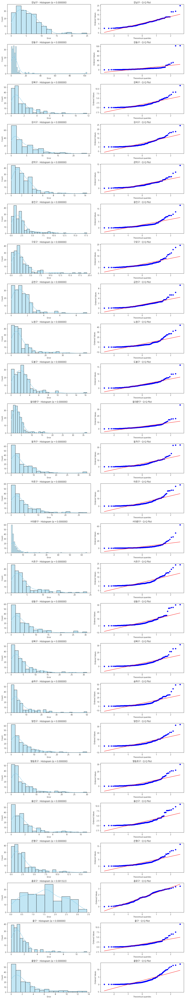

,region,shapiro_p_value,shapiro_5pct_result,anderson_statistic,anderson_5pct_critical,anderson_5pct_result,skewness,kurtosis
0,강남구,0.000000,정규성 기각,2.503217,0.771,정규성 기각,1.378834,3.603182
1,강동구,0.000000,정규성 기각,33.935510,0.771,정규성 기각,7.315150,59.540785
2,강북구,0.000000,정규성 기각,10.679840,0.771,정규성 기각,2.222721,6.816119
3,강서구,0.000000,정규성 기각,8.712920,0.771,정규성 기각,1.697628,3.572944
4,관악구,0.000000,정규성 기각,6.794593,0.771,정규성 기각,2.325236,8.905943
5,광진구,0.000000,정규성 기각,14.410264,0.771,정규성 기각,2.682890,9.481356
6,구로구,0.000000,정규성 기각,13.806111,0.771,정규성 기각,2.781664,9.718046
7,금천구,0.000000,정규성 기각,6.528979,0.771,정규성 기각,2.471893,10.134642
8,노원구,0.000000,정규성 기각,15.114537,0.771,정규성 기각,2.494857,7.445634
9,도봉구,0.000000,정규성 기각,6.516401,0.771,정규성 기각,2.413711,9.922435


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# ✅ DataFrame: result_details_df
regions = result_details_df['region'].unique()
n_regions = len(regions)

# 👉 region당 2개 subplot 필요 (히스토그램 + Q-Q)
n_plots = n_regions * 2
n_cols = 2
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
axes = axes.flatten()

# ✅ 결과 저장할 리스트 준비
normality_results = []

for i, region in enumerate(regions):
    region_errors = result_details_df[result_details_df['region'] == region]['error']

    # ✅ Shapiro-Wilk 정규성 검정
    if len(region_errors) >= 3:
        shapiro_stat, shapiro_p = stats.shapiro(region_errors)
    else:
        shapiro_p = None

    # ✅ Anderson-Darling 정규성 검정
    if len(region_errors) >= 3:
        anderson_result = stats.anderson(region_errors, dist='norm')
        anderson_stat = round(anderson_result.statistic, 6)

        # Anderson-Darling 결과에서 5% 유의수준 임계값 찾기
        try:
            idx_5 = list(anderson_result.significance_level).index(5.0)
            anderson_5pct_critical = anderson_result.critical_values[idx_5]
        except ValueError:
            anderson_5pct_critical = None
    else:
        anderson_stat = None
        anderson_5pct_critical = None

    # ✅ skewness (왜도) 계산
    if len(region_errors) >= 3:
        skewness = round(stats.skew(region_errors), 6)
    else:
        skewness = None

    # ✅ kurtosis (첨도) 계산 (Fisher's definition: 0 for normal distribution)
    if len(region_errors) >= 3:
        kurtosis = round(stats.kurtosis(region_errors, fisher=True), 6)
    else:
        kurtosis = None

    # ✅ 유의수준 5% 기준 정규성 판정
    if shapiro_p is not None:
        shapiro_normality = "정규성 유지" if shapiro_p > 0.05 else "정규성 기각"
    else:
        shapiro_normality = None

    if (anderson_stat is not None) and (anderson_5pct_critical is not None):
        anderson_normality = "정규성 유지" if anderson_stat < anderson_5pct_critical else "정규성 기각"
    else:
        anderson_normality = None

    # ✅ 결과 리스트에 저장
    normality_results.append({
        'region': region,
        'shapiro_p_value': round(shapiro_p, 6) if shapiro_p is not None else None,
        'shapiro_5pct_result': shapiro_normality,
        'anderson_statistic': anderson_stat,
        'anderson_5pct_critical': round(anderson_5pct_critical, 6) if anderson_5pct_critical is not None else None,
        'anderson_5pct_result': anderson_normality,
        'skewness': skewness,
        'kurtosis': kurtosis
    })

    # 히스토그램
    hist_ax = axes[i * 2]
    sns.histplot(region_errors, kde=True, ax=hist_ax, color='skyblue', edgecolor='black')
    if shapiro_p is not None:
        hist_ax.set_title(f"{region} - Histogram (p = {shapiro_p:.6f})")
    else:
        hist_ax.set_title(f"{region} - Histogram (p = N/A)")
    hist_ax.set_xlabel("Error")

    # Q-Q Plot
    qq_ax = axes[i * 2 + 1]
    stats.probplot(region_errors, dist="norm", plot=qq_ax)
    qq_ax.set_title(f"{region} - Q-Q Plot")

plt.tight_layout()
plt.show()

# ✅ 최종 결과 DataFrame 생성 및 출력
normality_df = pd.DataFrame(normality_results).sort_values('shapiro_p_value')
display(normality_df)

## 7.2) 행정구 별 예측 값 통계 값 파악

In [23]:
results = []

for region_name in region2idx.keys():
    region_id = region2idx[region_name]
    # result_df, meta = predict_and_detect_one_region(
    #     model=model,
    #     dataloader=test_loader,
    #     device=device,
    #     region_id=region_id,
    #     region_id_to_name={v: k for k, v in region2idx.items()},
    #     region_scaler_dict=scaler,
    #     threshold_k=2.0
    # )

    result_df = result_details_df[result_details_df['region'] == region_name]

    if result_df is not None:
        results.append({
            'region': region_name,
            'pred_mean': result_df['pred'].mean(),
            'pred_var': result_df['pred'].var(),
            'pred_std': result_df['pred'].std(),

            'actual_mean': result_df['actual'].mean(),
            'actual_var': result_df['actual'].var(),
            'actual_std': result_df['actual'].std(),

            'error_mean': result_df['error'].mean(),
            'error_var': result_df['error'].var(),
            'error_std': result_df['error'].std()
        })

# 결과 DataFrame 생성 및 정렬
df_region_preds = pd.DataFrame(results)
df_region_preds = df_region_preds.sort_values('error_mean', ascending=False).round(2)

# 출력
display(df_region_preds)

,region,pred_mean,pred_var,pred_std,actual_mean,actual_var,actual_std,error_mean,error_var,error_std
17,송파구,6.08,2.75,1.66,11.72,92.14,9.60,6.73,67.62,8.22
8,노원구,9.25,3.94,1.99,12.72,87.91,9.38,6.10,47.09,6.86
1,강동구,9.41,2.47,1.57,9.15,165.68,12.87,5.88,125.10,11.18
0,강남구,12.63,2.42,1.56,10.54,49.67,7.05,5.45,15.08,3.88
15,성동구,2.64,0.51,0.71,7.34,40.14,6.34,5.16,32.78,5.73
18,양천구,4.08,0.83,0.91,7.92,42.32,6.51,4.87,30.19,5.49
11,동작구,2.61,0.57,0.76,6.99,36.17,6.01,4.75,29.89,5.47
12,마포구,2.92,0.72,0.85,6.97,32.51,5.70,4.55,25.10,5.01
16,성북구,5.80,0.98,0.99,8.29,43.34,6.58,4.49,24.90,4.99
19,영등포구,6.13,1.76,1.33,8.58,40.45,6.36,4.31,23.08,4.80


In [24]:
import pandas as pd

def detect_anomalies_mean_std(df: pd.DataFrame, error_col='error', region_col='region', k=2.0):
    """
    각 region별로 mean + k * std 기준 이상탐지 후 is_anomaly 컬럼 생성

    Args:
        df (pd.DataFrame): 예측 결과 테이블
        error_col (str): 오차 컬럼명
        region_col (str): 지역 컬럼명
        k (float): 기준값 배수 (기본: 2.0)

    Returns:
        pd.DataFrame: is_anomaly 컬럼이 추가된 DataFrame
    """
    df = df.copy()

    # 각 지역별 임계값 계산
    thresholds = df.groupby(region_col)[error_col].agg(['mean', 'std'])
    thresholds['threshold'] = thresholds['mean'] + k * thresholds['std']

    # 병합하여 기준값 추가
    df = df.merge(thresholds[['threshold']], left_on=region_col, right_index=True)

    # 이상치 여부 판별
    df['is_anomaly'] = (df[error_col] > df['threshold'])

    # threshold 컬럼 제거하고 결과 반환
    df = df.drop(columns=['threshold'])
    return df

result_details_df = detect_anomalies_mean_std(result_details_df)
result_details_df

,region,forecast_date,pred,actual,error,is_anomaly
0,강남구,2024-07-01,13.474510,19.000000,5.525489,False
1,강남구,2024-07-02,13.658241,15.000001,1.341760,False
2,강남구,2024-07-03,13.782556,16.000000,2.217445,False
3,강남구,2024-07-04,13.891624,16.000000,2.108377,False
4,강남구,2024-07-05,13.990032,22.000000,8.009969,False
...,...,...,...,...,...,...
4595,중랑구,2024-12-27,1.205559,2.000000,0.794441,False
4596,중랑구,2024-12-28,1.021059,10.000000,8.978942,True
4597,중랑구,2024-12-29,0.735285,1.000000,0.264715,False
4598,중랑구,2024-12-30,0.918910,4.000000,3.081090,False


## 7.3) 이상탐지 결과 시각화

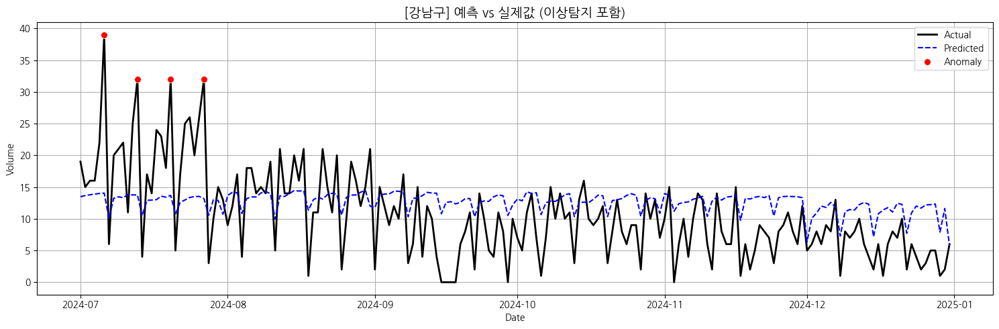

In [25]:
def plot_region_prediction_with_anomaly(df: pd.DataFrame, region_name: str, anomaly_type: str = "original", figsize=(15, 5)):
    """
    seaborn 기반 예측 vs 실제 + 이상탐지 시각화 (DataFrame 기반)

    Args:
        df (pd.DataFrame): predict_and_detect_one_region 반환 결과
        region_name (str): 지역 이름
        figsize (tuple): 그래프 크기
    """
    df = df.query("region == @region_name")

    df['forecast_date'] = pd.to_datetime(df['forecast_date'])

    # ✅ anomaly 컬럼 선택
    if anomaly_type == "original":
        anomaly_flag = "is_anomaly"
    elif anomaly_type == "otsu":
        anomaly_flag = "is_anomaly_otsu"
    elif anomaly_type == "adaptive_window":
        anomaly_flag = "is_adaptive_anomaly"
    elif anomaly_type == "adaptive_hybrid_window":
        anomaly_flag = "is_final_anomaly"
    elif anomaly_type == "adaptive_iqr_window":
        anomaly_flag = "is_iqr_adaptive_anomaly"
    else:
        raise ValueError("anomaly_type은 'original' 또는 'otsu'만 가능합니다.")

    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x="forecast_date", y="actual", label="Actual", linewidth=2, color="black")
    sns.lineplot(data=df, x="forecast_date", y="pred", label="Predicted", linestyle="--", color="blue")

    # ✅ 선택한 anomaly 컬럼 기반 scatter
    if anomaly_flag in df.columns:
        sns.scatterplot(
            data=df[df[anomaly_flag]],
            x="forecast_date", y="actual",
            color="red", s=50, label="Anomaly", zorder=5
        )
    else:
        print(f"'{anomaly_flag}' 컬럼이 존재하지 않습니다. 이상탐지 표시 없이 그래프를 그립니다.")

    plt.title(f"[{region_name}] 예측 vs 실제값 (이상탐지 포함)", fontsize=14)
    plt.xlabel("Date")
    plt.ylabel("Volume")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

region_name = "강남구"
region_id = region2idx[region_name]
region_id_to_name = {v: k for k, v in region2idx.items()}

if result_df is not None:
    plot_region_prediction_with_anomaly(result_details_df, region_name)
else:
    print(f"[{region_name}] 예측 결과가 없습니다.")

## 7.4) 행정구 별 이상치 비율

In [26]:
def analyze_all_regions(
    # model,
    # dataloader,
    # device,
    output,
    region2idx,
    region_scaler_dict,
    threshold_k=2.0,
    anomaly_type: str = "original"
):
    results = []

    region_id_to_name = {v: k for k, v in region2idx.items()}

    # ✅ 사용할 이상치 플래그 선택
    if anomaly_type == "original":
        anomaly_col = "is_anomaly"
    elif anomaly_type == "otsu":
        anomaly_col = "is_anomaly_otsu"
    elif anomaly_type == "adaptive_window":
        anomaly_col = "is_adaptive_anomaly"
    elif anomaly_type == "adaptive_hybrid_window":
        anomaly_col = "is_final_anomaly"
    elif anomaly_type == "adaptive_iqr_window":
        anomaly_col = "is_iqr_adaptive_anomaly"
    else:
        raise ValueError("anomaly_type은 'original' 또는 'otsu'만 가능합니다.")

    for region_name, region_id in region2idx.items():
        # output = predict_and_detect_one_region(
        #     model=model,
        #     dataloader=dataloader,
        #     device=device,
        #     region_id=region_id,
        #     region_id_to_name=region_id_to_name,
        #     region_scaler_dict=region_scaler_dict,
        #     threshold_k=threshold_k
        # )

        df_result = output[output['region'] == region_name]

        # if output is None:
        #     continue

        # df_result, meta = output  # ✅ 언패킹

        results.append({
            "region": region_name,
            # "threshold": meta["threshold"],
            # "mean_error": meta["mean_error"],
            # "std_error": meta["std_error"],
            "anomaly_ratio": df_result[anomaly_col].mean(),
            "sample_count": len(df_result)
        })

    stats_df = pd.DataFrame(results).sort_values("anomaly_ratio", ascending=False)

    # 시각화
    plt.figure(figsize=(15, 5))
    sns.barplot(data=stats_df, x="region", y="anomaly_ratio", palette='coolwarm')
    for idx, value in enumerate(stats_df["anomaly_ratio"]):
        plt.text(idx, value, f"{value:.3%}", ha="center", va="bottom", fontsize=9)

    plt.xlabel("지역")
    plt.ylabel("이상치 비율")
    plt.title("지역별 이상치 비율")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return stats_df


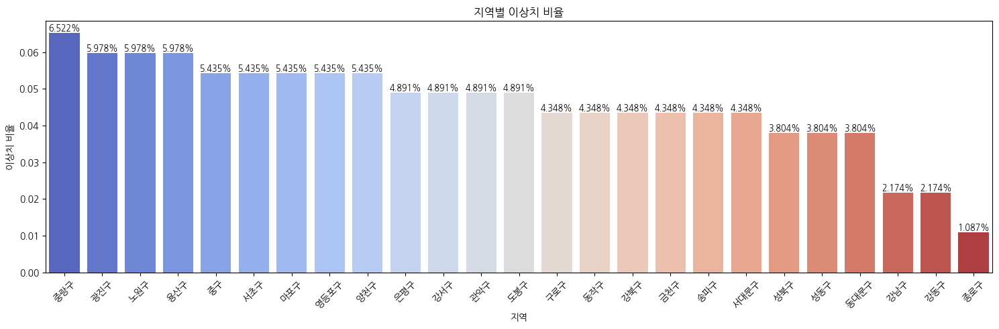

,region,anomaly_ratio,sample_count
24,중랑구,0.065217,184
5,광진구,0.059783,184
8,노원구,0.059783,184
20,용산구,0.059783,184
23,중구,0.054348,184
14,서초구,0.054348,184
12,마포구,0.054348,184
19,영등포구,0.054348,184
18,양천구,0.054348,184
21,은평구,0.048913,184


In [27]:
stats_df = analyze_all_regions(
    # model=model,
    # dataloader=test_loader,
    # device=device,
    output=result_details_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    threshold_k=2.0
)

stats_df

## 7.5) 행정구 별 이상치 Threshold

In [28]:
# 시각화
result_origin_thresholds_df = result_details_df[['region', 'threshold']].drop_duplicates()

plt.figure(figsize=(15, 5))
sns.barplot(data=result_origin_thresholds_df.sort_values('threshold', ascending=False), x="region", y="threshold", palette='coolwarm')
for idx, value in enumerate(result_origin_thresholds_df.sort_values('threshold', ascending=False)["threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

KeyError: "['threshold'] not in index"

## 7.6) Index 결과 비교 분석

In [ ]:
origin_test_df = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test1/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_modified.csv')
origin_test_df['date'] = pd.to_datetime(origin_test_df['date'])
result_details_df['forecast_date'] = pd.to_datetime(result_details_df['forecast_date'])

final_result_df = origin_test_df.merge(result_details_df, left_on=['region', 'date'], right_on=['region', 'forecast_date'])

In [ ]:
final_result_df.groupby('is_anomaly').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    direct_trade_index=('direct_trade_ratio', 'mean'),
    vdd_index=('vdd_index', 'mean'),
    anomaly_score=('anomaly_score', 'mean')
)

,volume_cnt,cancel_cnt,pod_index,canceld_index,direct_trade_index,vdd_index,anomaly_score
is_anomaly,,,,,,,
False,24283,967,0.338046,0.032527,0.042097,-0.128620,0.257458
True,4927,236,0.337680,0.052277,0.046684,1.389658,0.682488


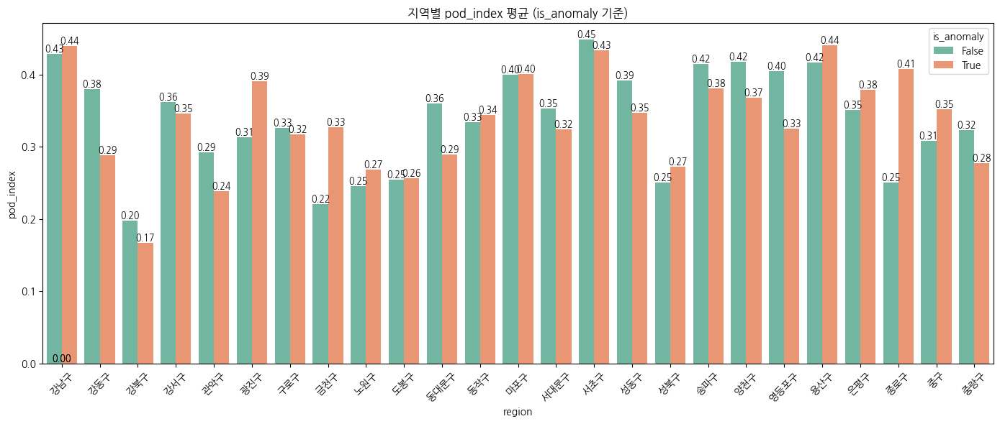

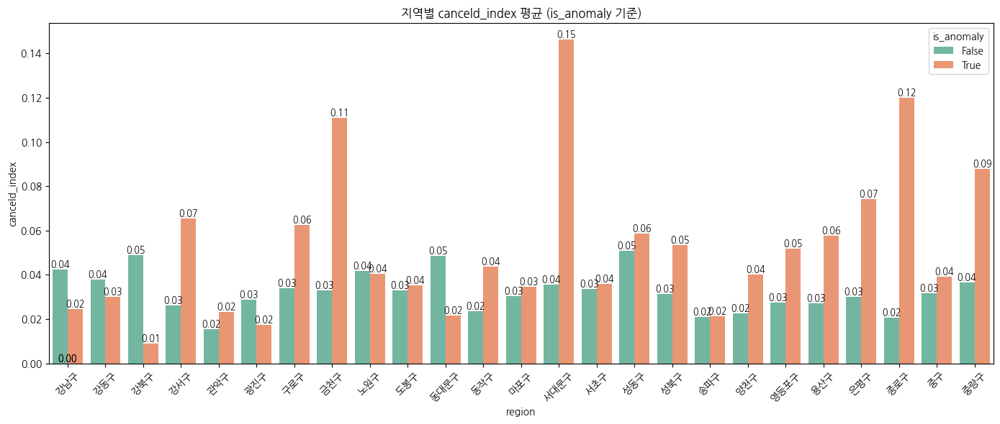

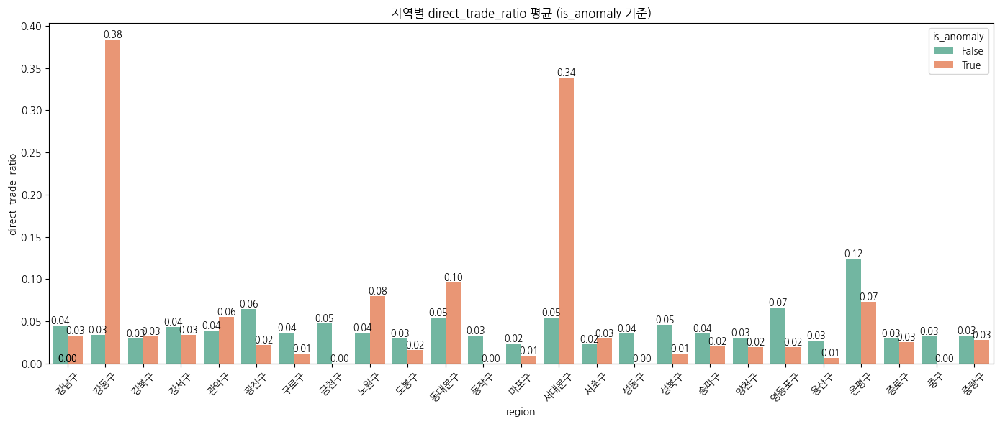

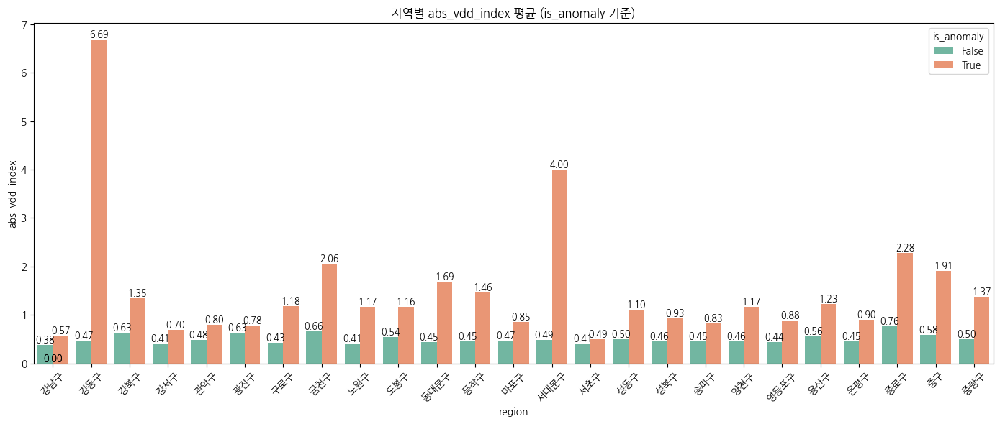

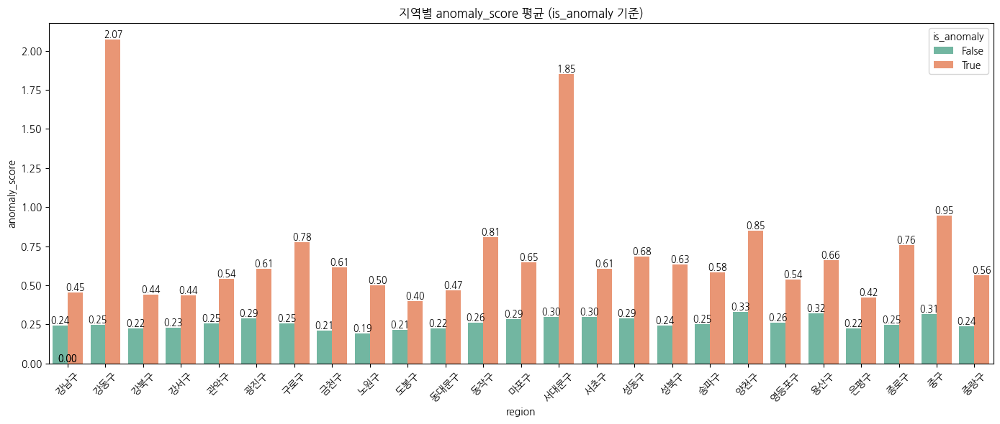

In [ ]:
final_result_df.groupby(['region', 'is_anomaly'])[['pod_index', 'canceld_index', 'vdd_index']].mean()

cols = ['pod_index', 'canceld_index', 'direct_trade_ratio', 'abs_vdd_index', 'anomaly_score']

# region + is_anomaly 그룹별 평균 계산
grouped_means = final_result_df.groupby(['region', 'is_anomaly'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_anomaly', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
# 최종 결과
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

print(anomaly_score_label_col)

# 실제 값 (정답 라벨)
y_true = final_result_df[anomaly_score_label_col].astype(int)

# 예측값 (bool → int로 변환)
y_pred = final_result_df['is_anomaly'].astype(int)

# 평가 지표 계산
precision = precision_score(y_true, y_pred)
recall    = recall_score(y_true, y_pred)
f1        = f1_score(y_true, y_pred)
accuracy  = accuracy_score(y_true, y_pred)

print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"Accuracy  : {accuracy:.4f}")


is_anomaly_score_outlier_mean_2sigma
Precision : 0.4159
Recall    : 0.3176
F1-score  : 0.3602
Accuracy  : 0.9274


In [ ]:
def find_best_k_for_mean_std_anomaly(
    df: pd.DataFrame,
    label_col: str,
    apt_volume_test_df_origin: pd.DataFrame,
    error_col: str = 'error',
    region_col: str = 'region',
    k_values=np.arange(1.0, 3.05, 0.2)
):
    best_k = None
    best_f1 = -1
    best_metrics = {}

    for k in k_values:

        # 이상탐지 수행
        result_df = detect_anomalies_mean_std(df, error_col=error_col, region_col=region_col, k=k)

        # forecast_date를 datetime 형식으로 변환
        result_df['forecast_date'] = pd.to_datetime(result_df['forecast_date'])

        # 정답 데이터와 병합
        merged = apt_volume_test_df_origin.merge(
            result_df,
            left_on=['region', 'date'],
            right_on=['region', 'forecast_date']
        )

        # 정답 및 예측값 추출
        y_true = merged[label_col].astype(int)
        y_pred = merged['is_anomaly'].astype(int)

        f1 = f1_score(y_true, y_pred, zero_division=0)
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        print(f"[k={k:.2f}→ F1 = {f1:.4f}, Precision = {precision:.4f}, Recall = {recall:.4f}, Accuracy = {accuracy:.4f}")

        if f1 > best_f1:
            best_f1 = f1
            best_k = k

            best_precision = precision
            best_recall = recall
            best_accuracy = accuracy

            print(f"\n✅ Best k = {best_k}")
            print(f"   ↳ F1-score  = {best_f1:.4f}")
            print(f"   ↳ Precision = {best_precision:.4f}")
            print(f"   ↳ Recall    = {best_recall:.4f}")
            print(f"   ↳ Accuracy  = {best_accuracy:.4f}")

            best_metrics = {
                'k': k,
                'f1_score': f1,
                'precision': precision,
                'recall': recall,
                'accuracy': accuracy
            }

    return best_metrics


In [ ]:
best_k_result = find_best_k_for_mean_std_anomaly(
    df=result_details_df,
    label_col=anomaly_score_label_col,
    apt_volume_test_df_origin=origin_test_df
)


[k=1.00→ F1 = 0.2302, Precision = 0.3894, Recall = 0.1634, Accuracy = 0.7004

✅ Best k = 1.0
   ↳ F1-score  = 0.2302
   ↳ Precision = 0.3894
   ↳ Recall    = 0.1634
   ↳ Accuracy  = 0.7004
[k=1.20→ F1 = 0.2101, Precision = 0.4041, Recall = 0.1420, Accuracy = 0.7074
[k=1.40→ F1 = 0.1852, Precision = 0.4282, Recall = 0.1182, Accuracy = 0.7150
[k=1.60→ F1 = 0.1723, Precision = 0.4412, Recall = 0.1071, Accuracy = 0.7180
[k=1.80→ F1 = 0.1568, Precision = 0.4630, Recall = 0.0944, Accuracy = 0.7217
[k=2.00→ F1 = 0.1416, Precision = 0.4730, Recall = 0.0833, Accuracy = 0.7233
[k=2.20→ F1 = 0.1342, Precision = 0.4925, Recall = 0.0777, Accuracy = 0.7252
[k=2.40→ F1 = 0.1176, Precision = 0.5030, Recall = 0.0666, Accuracy = 0.7261
[k=2.60→ F1 = 0.1012, Precision = 0.5000, Recall = 0.0563, Accuracy = 0.7259
[k=2.80→ F1 = 0.0894, Precision = 0.4921, Recall = 0.0492, Accuracy = 0.7254
[k=3.00→ F1 = 0.0732, Precision = 0.4762, Recall = 0.0397, Accuracy = 0.7248


## 7.7) 동적 임계 값 설정

### 7.7.1) Otsu Method

In [ ]:
import pandas as pd
import numpy as np
from skimage.filters import threshold_otsu

# ✅ DataFrame: result_details_df
# columns: ['region', 'forecast_date', 'pred', 'actual', 'error']

# 결과 저장용 리스트
otsu_results = []

# ✅ 지역별로 loop
for region, group in result_details_df.groupby('region'):
    errors = group['error'].values

    if len(errors) < 2:
        # 데이터가 너무 적으면 threshold 계산 불가
        otsu_threshold = None
        is_anomaly = [False] * len(errors)
    else:
        # ✅ Otsu Method로 threshold 계산
        otsu_threshold = threshold_otsu(errors)

        # ✅ 이상치 탐지 (error > otsu_threshold이면 이상치로 간주)
        is_anomaly = errors > otsu_threshold

    # 결과 저장
    region_result = group.copy()
    region_result['otsu_threshold'] = otsu_threshold
    region_result['is_anomaly_otsu'] = is_anomaly

    otsu_results.append(region_result)

# ✅ 모든 지역 결과 합치기
final_otsu_result_df = pd.concat(otsu_results, axis=0).reset_index(drop=True)

# ✅ 결과 확인
display(final_otsu_result_df)


In [ ]:
region_name = "도봉구"

# ✅ result_df, meta = predict_and_detect_one_region(...) 호출해서 result_details_df 생성했다고 가정

# 🔵 기본 original 이상치 결과 보기
plot_region_prediction_with_anomaly(final_otsu_result_df, region_name, anomaly_type="original")

# 🔴 Otsu 기반 이상치 결과 보기
plot_region_prediction_with_anomaly(final_otsu_result_df, region_name, anomaly_type="otsu")

In [ ]:
# 🔴 Otsu 기반 이상치 비율 분석
stats_otsu = analyze_all_regions(
    output=final_otsu_result_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    anomaly_type="otsu"
)

# stats_otsu

In [ ]:
otsu_threshold_result = final_otsu_result_df[['region', 'otsu_threshold']].drop_duplicates()


# 시각화
plt.figure(figsize=(15, 5))
sns.barplot(data=otsu_threshold_result.sort_values('otsu_threshold', ascending=False), x="region", y="otsu_threshold", palette='coolwarm')
for idx, value in enumerate(otsu_threshold_result.sort_values('otsu_threshold', ascending=False)["otsu_threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
final_otsu_result_df['forecast_date'] = pd.to_datetime(final_otsu_result_df['forecast_date'])

final_otsu_result_df_temp = origin_test_df.merge(final_otsu_result_df, left_on=['region', 'date'], right_on=['region', 'forecast_date'])

final_otsu_result_df_temp.groupby('is_anomaly_otsu').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    vdd_index=('vdd_index', 'mean')
)

In [ ]:
final_otsu_result_df_temp.groupby(['region', 'is_anomaly_otsu'])[['pod_index', 'canceld_index', 'vdd_index']].mean()

cols = ['pod_index', 'canceld_index', 'vdd_index']

# region + is_anomaly 그룹별 평균 계산
grouped_means = final_otsu_result_df_temp.groupby(['region', 'is_anomaly_otsu'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_anomaly_otsu', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### 7.7.2) Window Sliding
* Adaptive Threshold with Sliding Window

In [9]:
from scipy import stats

def adaptive_threshold_detection_with_valid(
    valid_df: pd.DataFrame,
    test_df: pd.DataFrame,
    region_col: str = 'region',
    error_col: str = 'error',
    date_col: str = 'forecast_date',
    baseline_days: int = 30,
    new_window_size: int = 30,
    threshold_k: float = 2.0,
    ztest_alpha: float = 0.05
) -> pd.DataFrame:
    """
    valid set의 마지막 기간을 baseline으로 사용하고,
    test set에 대해 adaptive threshold 이상탐지 수행

    Returns:
        pd.DataFrame: test_df에 is_adaptive_anomaly, dynamic_threshold, adaptive_threshold 컬럼 추가
    """
    results = []

    for region in test_df[region_col].unique():
        test_region = test_df[test_df[region_col] == region].sort_values(date_col).reset_index(drop=True)
        valid_region = valid_df[valid_df[region_col] == region].sort_values(date_col)

        # ✅ baseline 구간: valid set 마지막 baseline_days 일
        baseline_region = valid_region.tail(baseline_days)
        if len(baseline_region) < baseline_days:
            print(f"[경고] {region}: baseline 구간 데이터 부족")
            continue

        baseline_errors = baseline_region[error_col].values
        mu_baseline = np.mean(baseline_errors)
        sigma_baseline = np.std(baseline_errors)
        threshold = mu_baseline + threshold_k * sigma_baseline

        errors = test_region[error_col].values
        n = len(errors)

        anomalies = []
        thresholds = []

        # ✅ 슬라이딩 윈도우
        for i in range(0, n, new_window_size):
            new_window = errors[i:i+new_window_size]

            if len(new_window) < 5:
                anomalies.extend([False] * len(new_window))
                thresholds.extend([threshold] * len(new_window))
                continue

            mu_new = np.mean(new_window)
            sigma_new = np.std(new_window)

            # z-test
            z_score = np.abs(mu_new - mu_baseline) / np.sqrt((sigma_new**2/len(new_window)) + (sigma_baseline**2/baseline_days))
            p_value = 2 * (1 - stats.norm.cdf(z_score))

            if p_value < ztest_alpha:
                # baseline 업데이트
                baseline_errors = new_window
                mu_baseline = mu_new
                sigma_baseline = sigma_new
                threshold = mu_baseline + threshold_k * sigma_baseline

            window_anomalies = new_window > threshold
            anomalies.extend(window_anomalies)
            thresholds.extend([threshold] * len(new_window))

        anomalies = anomalies[:n]
        thresholds = thresholds[:n]

        test_region['dynamic_threshold'] = thresholds
        test_region['adaptive_threshold'] = np.mean(thresholds)
        test_region['is_adaptive_anomaly'] = anomalies

        results.append(test_region)

    return pd.concat(results, ignore_index=True)


In [29]:
# ✅ result_details_df: region, forecast_date, pred, actual, error 컬럼을 가진 DataFrame

adaptive_result_df = adaptive_threshold_detection_with_valid(
    valid_df=valid_result_df,
    test_df=test_result_df,
    baseline_days=30
)

adaptive_result_df

,region,forecast_date,pred,actual,error,dynamic_threshold,adaptive_threshold,is_adaptive_anomaly
0,강남구,2024-07-01,13.474510,19.000000,5.525489,19.757872,13.783645,False
1,강남구,2024-07-02,13.658241,15.000001,1.341760,19.757872,13.783645,False
2,강남구,2024-07-03,13.782556,16.000000,2.217445,19.757872,13.783645,False
3,강남구,2024-07-04,13.891624,16.000000,2.108377,19.757872,13.783645,False
4,강남구,2024-07-05,13.990032,22.000000,8.009969,19.757872,13.783645,False
...,...,...,...,...,...,...,...,...
4595,중랑구,2024-12-27,1.205559,2.000000,0.794441,5.003509,5.585985,False
4596,중랑구,2024-12-28,1.021059,10.000000,8.978942,5.003509,5.585985,False
4597,중랑구,2024-12-29,0.735285,1.000000,0.264715,5.003509,5.585985,False
4598,중랑구,2024-12-30,0.918910,4.000000,3.081090,5.003509,5.585985,False


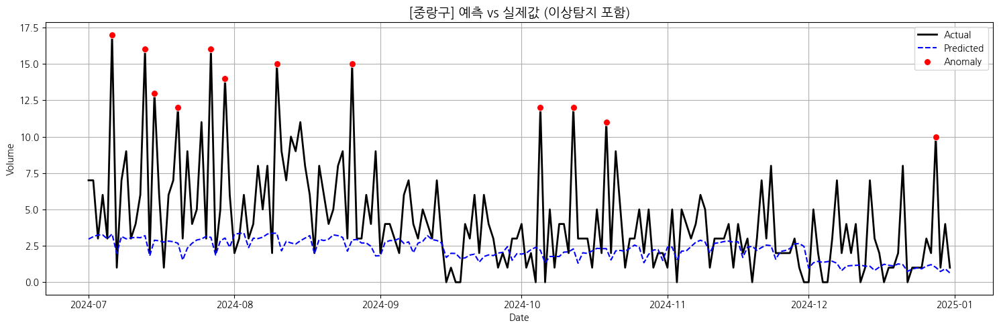

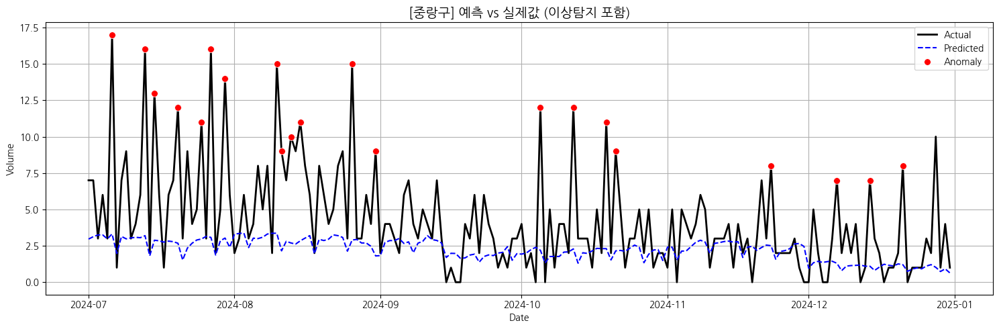

In [33]:
region_name = "중랑구"

# ✅ result_df, meta = predict_and_detect_one_region(...) 호출해서 result_details_df 생성했다고 가정

# 🔵 기본 original 이상치 결과 보기
plot_region_prediction_with_anomaly(result_details_df, region_name, anomaly_type="original")

# 🔴 Otsu 기반 이상치 결과 보기
# plot_region_prediction_with_anomaly(adaptive_result_df, region_name, anomaly_type="otsu")

plot_region_prediction_with_anomaly(adaptive_result_df, region_name, anomaly_type="adaptive_window")

# plot_region_prediction_with_anomaly(adaptive_result_hybrid_df, region_name, anomaly_type="adaptive_hybrid_window")

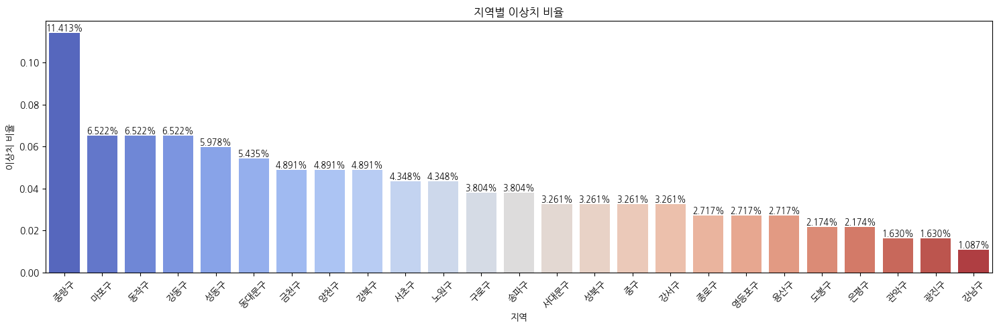

,region,anomaly_ratio,sample_count
24,중랑구,0.114130,184
12,마포구,0.065217,184
11,동작구,0.065217,184
1,강동구,0.065217,184
15,성동구,0.059783,184
10,동대문구,0.054348,184
7,금천구,0.048913,184
18,양천구,0.048913,184
2,강북구,0.048913,184
14,서초구,0.043478,184


In [34]:
# 🔴 adaptive 기반 이상치 비율 분석
analyze_all_regions(
    output=adaptive_result_df,
    region2idx=region2idx,
    region_scaler_dict=scaler,
    anomaly_type="adaptive_window"
)

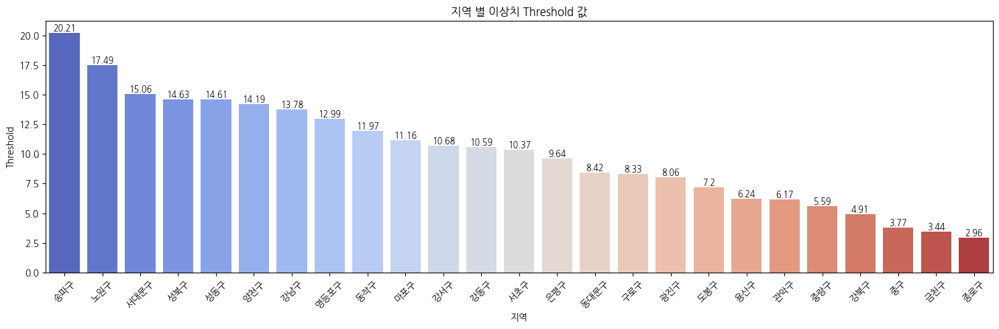

In [35]:
adaptive_window_threshold_df = adaptive_result_df[['region', 'adaptive_threshold']].drop_duplicates()

# 시각화
plt.figure(figsize=(15, 5))
sns.barplot(data=adaptive_window_threshold_df.sort_values('adaptive_threshold', ascending=False), x="region", y="adaptive_threshold", palette='coolwarm')
for idx, value in enumerate(adaptive_window_threshold_df.sort_values('adaptive_threshold', ascending=False)["adaptive_threshold"]):
    plt.text(idx, value, f"{np.round(value, 2)}", ha="center", va="bottom", fontsize=9)

plt.xlabel("지역")
plt.ylabel("Threshold")
plt.title("지역 별 이상치 Threshold 값")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [36]:
apt_volume_test_df_origin = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi3.csv')
apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])

adaptive_result_df['forecast_date'] = pd.to_datetime(adaptive_result_df['forecast_date'])

adaptive_result_df_temp = apt_volume_test_df_origin.merge(adaptive_result_df, left_on=['region', 'date'], right_on=['region', 'forecast_date'])

adaptive_result_df_temp.groupby('is_adaptive_anomaly').agg(
    volume_cnt=('volume_cnt', 'sum'),
    cancel_cnt=('cancel_cnt', 'sum'),

    pod_index=('pod_index', 'mean'),
    canceld_index=('canceld_index', 'mean'),
    direct_trade_index=('direct_trade_ratio', 'mean'),
    abs_vdd_index=('abs_vdd_index', 'mean'),

    anomaly_score=('anomaly_score', 'mean')
)

,volume_cnt,cancel_cnt,pod_index,canceld_index,direct_trade_index,abs_vdd_index,anomaly_score
is_adaptive_anomaly,,,,,,,
False,25483,1029,0.338245,0.032681,0.042456,0.492392,0.220019
True,3727,174,0.333008,0.052445,0.039218,1.690250,0.453003


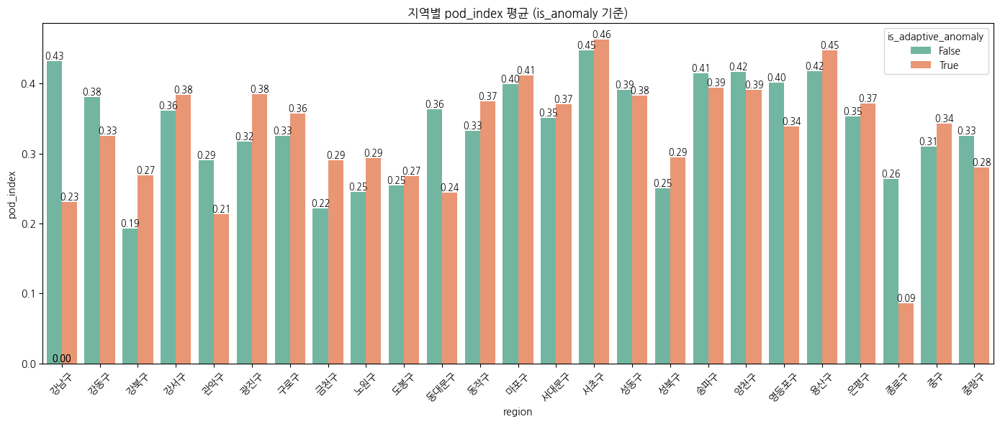

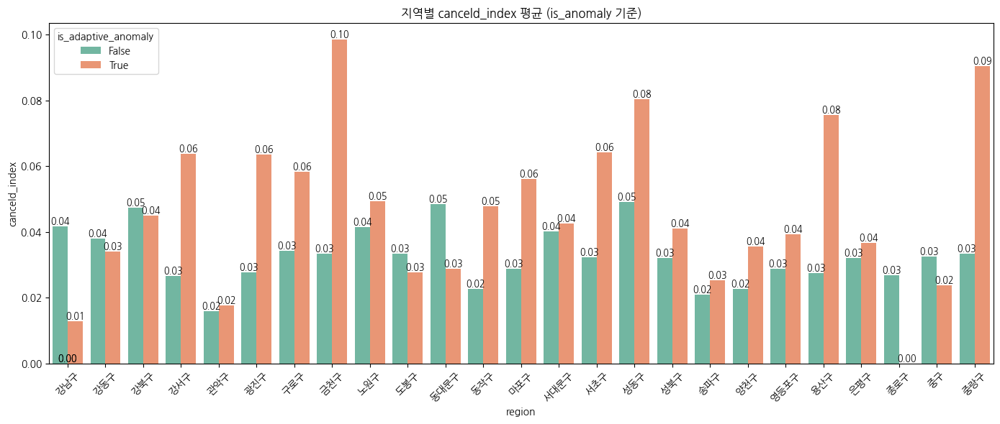

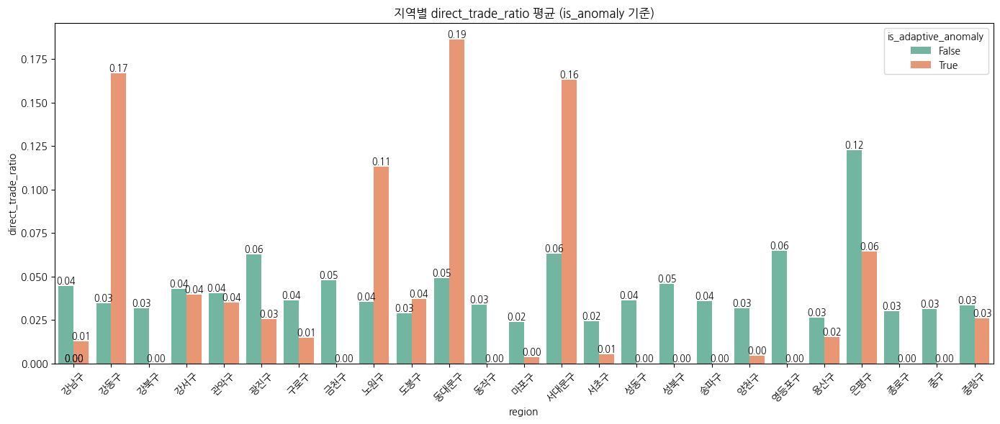

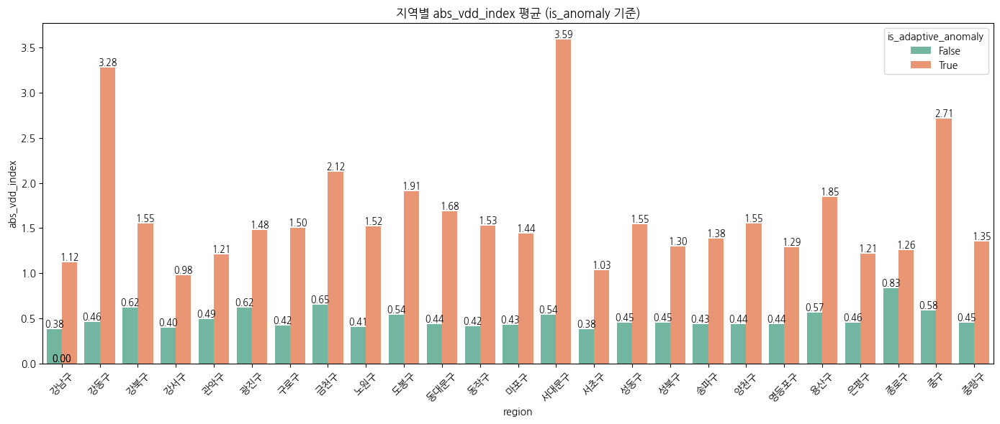

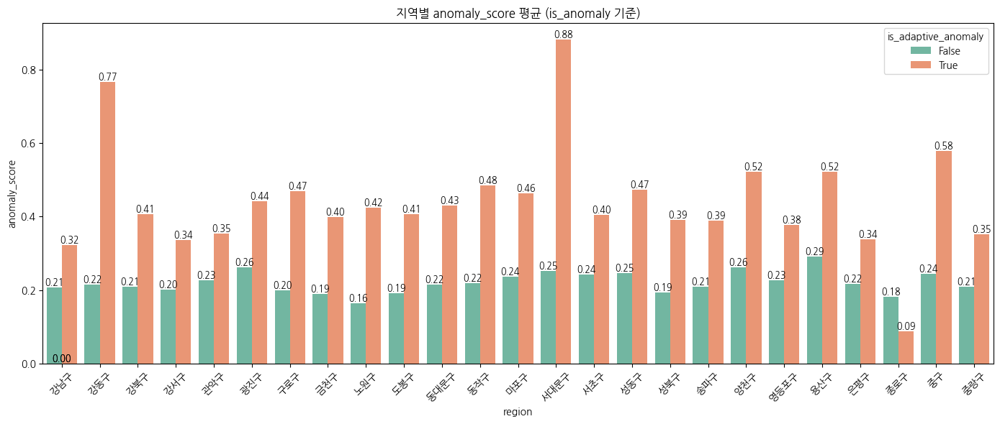

In [37]:
cols = ['pod_index', 'canceld_index', 'direct_trade_ratio', 'abs_vdd_index', 'anomaly_score']

# region + is_anomaly 그룹별 평균 계산
grouped_means = adaptive_result_df_temp.groupby(['region', 'is_adaptive_anomaly'])[cols].mean().reset_index()

for col in cols:
    plt.figure(figsize=(14, 6))
    ax = sns.barplot(data=grouped_means, x='region', y=col, hue='is_adaptive_anomaly', palette='Set2')

    # 막대 위에 텍스트 표시
    for p in ax.patches:
        height = p.get_height()
        if not np.isnan(height):
            ax.text(
                x=p.get_x() + p.get_width() / 2,
                y=height,
                s=f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

    plt.title(f'지역별 {col} 평균 (is_anomaly 기준)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [38]:
# 최종 결과
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 실제 값 (정답 라벨)
print(anomaly_score_label_col)
y_true = adaptive_result_df_temp[anomaly_score_label_col].astype(int)

# 예측값 (bool → int로 변환)
y_pred = adaptive_result_df_temp['is_adaptive_anomaly'].astype(int)

# 평가 지표 계산
precision = precision_score(y_true, y_pred)
recall    = recall_score(y_true, y_pred)
f1        = f1_score(y_true, y_pred)
accuracy  = accuracy_score(y_true, y_pred)

print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")
print(f"Accuracy  : {accuracy:.4f}")


is_anomaly_score_outlier_mean_2sigma_win30
Precision : 0.5368
Recall    : 0.4574
F1-score  : 0.4939
Accuracy  : 0.9546


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
import torch

MAX_TRIALS = 1000  # 최대 시도 횟수
TARGET_F1 = 0.5
trial = 0
best_f1 = -1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

rmse_fn = RMSELoss()
mae_fn = MAELoss()

apt_volume_test_df_origin = pd.read_csv('/content/drive/MyDrive/sogang_thesis_prj/dataset/final_test3/apt_sales_volume_daily_register_202111_202412_test_anomaly_score_label_combi3.csv')

while trial < MAX_TRIALS:
    trial += 1
    print(f"\n🚀 [Trial {trial}] Start Training...")

    # 모델 초기화 (반복마다 새로)
    model = APTRegionInformer(
        enc_in=48,            # x_enc의 마지막 차원
        dec_in=48,            # x_dec의 마지막 차원
        c_out=1,             # y의 feature 수 (현재 y가 [64, 5]라면 c_out=1, 다변량이면 다르게)
        seq_len=30,          # x_enc의 시계열 길이
        label_len=10,        # x_dec의 과거 부분 길이 (20 = 15 past + 5 future 라면 이게 맞음)
        out_len=1,           # y 또는 미래 예측 길이 (5일 예측)
        region_vocab_size=25,
        region_emb_dim=64,
        d_model=64,
        d_ff=256,
        dropout=0.1,

        e_layers=2,
        d_layers=2,
        n_heads=4
    )

    model = model.to(device)

    criterion = nn.MSELoss()
    lr_rate = 1e-4
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr_rate)

    # ✅ 훈련
    for epoch in range(50):
        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device, mae_fn, rmse_fn)
        val_metrics = evaluate(model, val_loader, criterion, device, mae_fn, rmse_fn)

        print(f"[Epoch {epoch+1}]")
        print(f"Train Loss: {train_metrics['loss']:.4f}, RMSE: {train_metrics['rmse']:.4f}, MAE: {train_metrics['mae']:.4f}")
        print(f"Val   Loss: {val_metrics['loss']:.4f}, RMSE: {val_metrics['rmse']:.4f}, MAE: {val_metrics['mae']:.4f}")

    # ✅ 예측
    result_df_dict = predict_all_regions_by_split(
        model=model,
        device=device,
        region2idx=region2idx,
        region_scaler_dict=scaler,
        train_loader=train_loader,
        valid_loader=val_loader,
        test_loader=test_loader,
        train_period=("2021-11-01", "2024-01-31"),
        valid_period=("2024-02-01", "2024-05-31"),
        test_period=("2024-06-01", "2024-12-31"),
        input_len=30,
        label_len=10,
        pred_len=1
    )

    train_result_df = result_df_dict["train"]
    valid_result_df = result_df_dict["valid"]
    test_result_df  = result_df_dict["test"]

    # ✅ Adaptive threshold 이상탐지 수행
    adaptive_result_df = adaptive_threshold_detection_with_valid(
        valid_df=result_df_dict["valid"],
        test_df=test_result_df,
        threshold_k=2.0,
        new_window_size=30,
        baseline_days=30
    )

    # ✅ 원본 테스트 데이터 병합
    apt_volume_test_df_origin['date'] = pd.to_datetime(apt_volume_test_df_origin['date'])
    adaptive_result_df['forecast_date'] = pd.to_datetime(adaptive_result_df['forecast_date'])
    adaptive_result_df_temp = apt_volume_test_df_origin.merge(
        adaptive_result_df,
        left_on=['region', 'date'],
        right_on=['region', 'forecast_date']
    )

    # ✅ 평가 지표 계산
    y_true = adaptive_result_df_temp[anomaly_score_label_col].astype(int)
    y_pred = adaptive_result_df_temp['is_adaptive_anomaly'].astype(int)

    precision = precision_score(y_true, y_pred)
    recall    = recall_score(y_true, y_pred)
    f1        = f1_score(y_true, y_pred)

    print(f"[Trial {trial}] Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")

    # ✅ F1 만족 시 종료
    if f1 <= TARGET_F1:
        print(f"\n✅ Target F1-score {f1:.4f} achieved at trial {trial}.")
        torch.save(model.state_dict(), f'apt_volume_pred_informer_50_202111_202412_{anomaly_score_label_col}_index_delete_{trial}.pth')

        train_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_train_202111_202412_{anomaly_score_label_col}_index_delete_{trial}.csv', index=False)
        valid_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_valid_202111_202412_{anomaly_score_label_col}_index_delete_{trial}.csv', index=False)
        test_result_df.to_csv(f'apt_volume_pred_informer_50_pred_result_test_202111_202412_{anomaly_score_label_col}_index_delete_{trial}.csv', index=False)

        break

else:
    print("\n❌ F1-score target not met within trial limit.")



🚀 [Trial 1] Start Training...
[Epoch 1]
Train Loss: 0.0465, RMSE: 0.1937, MAE: 0.1605
Val   Loss: 0.2061, RMSE: 0.4432, MAE: 0.3390
[Epoch 2]
Train Loss: 0.0361, RMSE: 0.1767, MAE: 0.1448
Val   Loss: 0.1996, RMSE: 0.4364, MAE: 0.3321
[Epoch 3]
Train Loss: 0.0352, RMSE: 0.1754, MAE: 0.1439
Val   Loss: 0.1959, RMSE: 0.4325, MAE: 0.3281
[Epoch 4]
Train Loss: 0.0349, RMSE: 0.1748, MAE: 0.1433
Val   Loss: 0.1911, RMSE: 0.4273, MAE: 0.3232
[Epoch 5]
Train Loss: 0.0345, RMSE: 0.1742, MAE: 0.1428
Val   Loss: 0.1849, RMSE: 0.4201, MAE: 0.3165
[Epoch 6]
Train Loss: 0.0343, RMSE: 0.1737, MAE: 0.1424
Val   Loss: 0.1758, RMSE: 0.4094, MAE: 0.3066
[Epoch 7]
Train Loss: 0.0341, RMSE: 0.1733, MAE: 0.1421
Val   Loss: 0.1710, RMSE: 0.4035, MAE: 0.3016
[Epoch 8]
Train Loss: 0.0339, RMSE: 0.1729, MAE: 0.1418
Val   Loss: 0.1667, RMSE: 0.3979, MAE: 0.2970
[Epoch 9]
Train Loss: 0.0338, RMSE: 0.1726, MAE: 0.1418
Val   Loss: 0.1624, RMSE: 0.3927, MAE: 0.2928
[Epoch 10]
Train Loss: 0.0337, RMSE: 0.1722, MAE: 0

In [39]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import numpy as np
import pandas as pd

def find_best_threshold_k_and_window(
    valid_df,
    test_df,
    apt_volume_test_df_origin,
    label_col='is_anomaly_score_outlier_5.0%',
    k_list=np.arange(1.0, 3.0, 0.1),
    window_list=np.arange(1, 31, 1)
):
    best_k = None
    best_window = None
    best_f1 = -1
    best_result_df = None

    best_precision = None
    best_recall = None
    best_accuracy = None

    for k in k_list:
        for win in window_list:
            result_df = adaptive_threshold_detection_with_valid(
                valid_df=valid_df,
                test_df=test_df,
                threshold_k=k,
                new_window_size=win
            )

            result_df['forecast_date'] = pd.to_datetime(result_df['forecast_date'])
            result_df = apt_volume_test_df_origin.merge(
                result_df,
                left_on=['region', 'date'],
                right_on=['region', 'forecast_date']
            )

            y_true = result_df[label_col].astype(int)
            y_pred = result_df['is_adaptive_anomaly'].astype(int)

            if y_true.sum() == 0 and y_pred.sum() == 0:
                f1 = 0.0
                precision = 0.0
                recall = 0.0
                accuracy = 1.0
            else:
                f1 = f1_score(y_true, y_pred, zero_division=0)
                precision = precision_score(y_true, y_pred, zero_division=0)
                recall = recall_score(y_true, y_pred, zero_division=0)
                accuracy = accuracy_score(y_true, y_pred)

            print(f"[k={k:.2f}, win={win}] → F1 = {f1:.4f}, Precision = {precision:.4f}, Recall = {recall:.4f}, Accuracy = {accuracy:.4f}")

            if f1 > best_f1:
                best_f1 = f1
                best_k = k
                best_window = win
                best_result_df = result_df.copy()

                best_precision = precision
                best_recall = recall
                best_accuracy = accuracy

    print(f"\n✅ Best k = {best_k}, window = {best_window}")
    print(f"   ↳ F1-score  = {best_f1:.4f}")
    print(f"   ↳ Precision = {best_precision:.4f}")
    print(f"   ↳ Recall    = {best_recall:.4f}")
    print(f"   ↳ Accuracy  = {best_accuracy:.4f}")

    return best_k, best_window, best_f1, best_precision, best_recall, best_accuracy, best_result_df


In [40]:
best_k, best_window, best_f1, best_precision, best_recall, best_accuracy, best_result_df = find_best_threshold_k_and_window(
    valid_df=valid_result_df,
    test_df=test_result_df,
    apt_volume_test_df_origin=apt_volume_test_df_origin,
    label_col=anomaly_score_label_col
)

[k=1.00, win=1] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=2] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=3] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=4] → F1 = 0.0000, Precision = 0.0000, Recall = 0.0000, Accuracy = 0.9515
[k=1.00, win=5] → F1 = 0.2702, Precision = 0.1619, Recall = 0.8161, Accuracy = 0.7863
[k=1.00, win=6] → F1 = 0.3085, Precision = 0.1912, Recall = 0.7982, Accuracy = 0.8265
[k=1.00, win=7] → F1 = 0.3143, Precision = 0.1947, Recall = 0.8161, Accuracy = 0.8274
[k=1.00, win=8] → F1 = 0.3346, Precision = 0.2117, Recall = 0.7982, Accuracy = 0.8461
[k=1.00, win=9] → F1 = 0.3433, Precision = 0.2208, Recall = 0.7713, Accuracy = 0.8570
[k=1.00, win=10] → F1 = 0.3423, Precision = 0.2179, Recall = 0.7982, Accuracy = 0.8513
[k=1.00, win=11] → F1 = 0.3486, Precision = 0.2226, Recall = 0.8027, Accuracy = 0.8546
[k=1.00, win=12] → F1 = 0.3537, Precision = 0.2324, 

### 7.7.3) Window Sliding (사분위수)

In [ ]:
# import pandas as pd
# import numpy as np

# def adaptive_threshold_detection_median_shift(df: pd.DataFrame,
#                                                region_col: str = 'region',
#                                                error_col: str = 'error',
#                                                date_col: str = 'forecast_date',
#                                                baseline_size: int = 30,
#                                                new_window_size: int = 30,
#                                                threshold_shift_ratio: float = 0.5) -> pd.DataFrame:
#     """
#     Adaptive Thresholding with Sliding Window and Median Shift 기준 이상탐지

#     Args:
#         df (pd.DataFrame): input dataframe
#         region_col (str): 지역 컬럼명
#         error_col (str): 에러 컬럼명
#         date_col (str): 날짜 컬럼명
#         baseline_size (int): 초기 baseline 윈도우 크기
#         new_window_size (int): 새 데이터 윈도우 크기
#         threshold_shift_ratio (float): median shift가 baseline IQR 대비 이 비율 이상이면 baseline 업데이트
#         threshold_type (str): "iqr"만 지원 (Q3 + 1.5 * IQR)

#     Returns:
#         pd.DataFrame: is_adaptive_anomaly 컬럼 추가된 DataFrame
#     """
#     results = []

#     for region, group in df.groupby(region_col):
#         group = group.sort_values(date_col).reset_index(drop=True)

#         errors = group[error_col].values
#         n = len(errors)

#         # 초기 baseline
#         baseline_errors = errors[:baseline_size]

#         q1 = np.percentile(baseline_errors, 25)
#         q3 = np.percentile(baseline_errors, 75)
#         iqr = q3 - q1
#         median_baseline = np.median(baseline_errors)

#         threshold = q3 + 1.5 * iqr

#         anomalies = [False] * baseline_size  # 초기 구간은 이상탐지 안함

#         # 슬라이딩 윈도우 진행
#         for i in range(baseline_size, n, new_window_size):
#             new_window = errors[i:i+new_window_size]

#             if len(new_window) < 5:
#                 anomalies.extend([False] * len(new_window))
#                 continue

#             # 새 윈도우 중앙값, 사분위수 계산
#             median_new = np.median(new_window)
#             q1_new = np.percentile(new_window, 25)
#             q3_new = np.percentile(new_window, 75)
#             iqr_new = q3_new - q1_new

#             # ✅ Median shift 계산
#             shift_ratio = np.abs(median_new - median_baseline) / (iqr if iqr != 0 else 1e-8)

#             if shift_ratio >= threshold_shift_ratio:
#                 # ✅ 분포 변화 감지 → baseline 업데이트
#                 baseline_errors = new_window
#                 median_baseline = median_new
#                 iqr = iqr_new
#                 threshold = q3_new + 1.5 * iqr_new

#             # ✅ 현재 threshold 기준으로 이상탐지
#             window_anomalies = new_window > threshold
#             anomalies.extend(window_anomalies)

#         group['adaptive_iqr_threshold'] = threshold
#         group['is_iqr_adaptive_anomaly'] = anomalies[:n]  # 길이 맞추기
#         results.append(group)

#     final_df = pd.concat(results, axis=0).reset_index(drop=True)
#     return final_df


## 7.8) Domain 기반 후처리

In [ ]:
adaptive_result_df_temp = adaptive_result_df_temp.rename(columns={'anomaly_score':'domain_anomaly_score'})

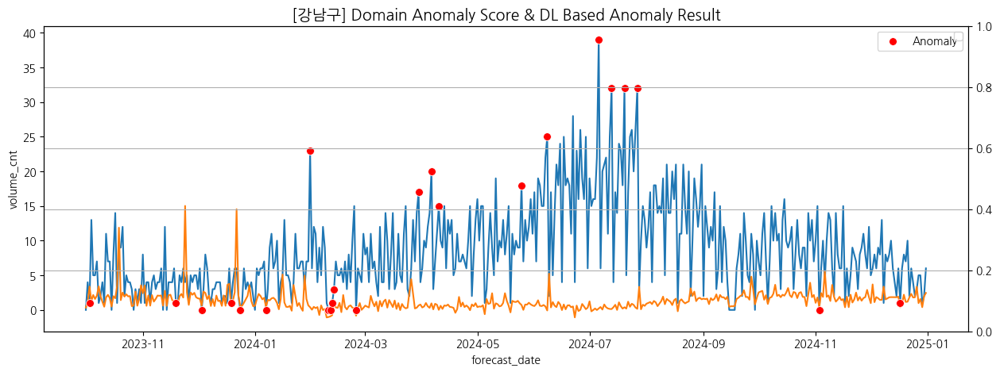

In [ ]:
region_name = '강남구'

tar_region_adaptive_result_df_temp = adaptive_result_df_temp.query("region == @region_name")

fig, ax1 = plt.subplots(figsize=(15, 5))
ax2 = ax1.twinx()

sns.lineplot(data=tar_region_adaptive_result_df_temp, x='forecast_date', y='volume_cnt', ax=ax1)
sns.lineplot(data=tar_region_adaptive_result_df_temp, x='forecast_date', y='domain_anomaly_score', ax=ax1)

sns.scatterplot(
            data=tar_region_adaptive_result_df_temp[tar_region_adaptive_result_df_temp['is_adaptive_anomaly']],
            x="forecast_date", y="actual",
            color="red", s=50, label="Anomaly", zorder=5, ax=ax1
        )

plt.title(f"[{region_name}] Domain Anomaly Score & DL Based Anomaly Result", fontsize=14)
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.show()